# Imports

In [2]:
import os, warnings
import dicom
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import collections
import xml.etree.ElementTree as ET
from Queue import *

from pylab import *
from mpl_toolkits.mplot3d.axes3d import Axes3D

from scipy import ndimage as ndi

from skimage.morphology import watershed
from skimage.feature import peak_local_max

# Config

In [3]:
NS = {'nih': 'http://www.nih.gov'}
lidc_path = "/home/usuario/imagens-medicas/lidc/LIDC-IDRI"
verbose = True

# LIDC XML Loader

In [4]:
# Based on https://github.com/zhwhong/lidc_nodule_detection/blob/master/api_lidc/nodule_structs.py

class NoduleCharacteristics:
    def __init__(self):
        self.subtlety = 0
        self.internal_struct = 0
        self.calcification = 0
        self.sphericity = 0
        self.margin = 0
        self.lobulation = 0
        self.spiculation = 0
        self.texture = 0
        self.malignancy = 0
        return

    def __str__(self):
        str = "subtlety (%d) int_struct (%d) calci (%d) sphere (%d) " \
              "margin (%d) lob (%d) spicul (%d) txtur (%d) malig (%d)" % (
                  self.subtlety, self.internal_struct, self.calcification,
                  self.sphericity,
                  self.margin, self.lobulation, self.spiculation, self.texture,
                  self.malignancy)
        return str

    def set_values(self, sub, inter, calc, spher, lob, spic, tex, malig):
        self.subtlety = sub
        self.internal_struct = inter
        self.calcification = calc
        self.sphericity = spher
        self.lobulation = lob
        self.spiculation = spic
        self.texture = tex
        self.malignancy = malig
        return


class NoduleRoi:  # is common for nodule and non-nodule
    def __init__(self, z_pos=0., sop_uid=''):
        self.z = z_pos
        self.sop_uid = sop_uid
        self.inclusion = True

        self.roi_xy = []  # to hold list of x,ycords in edgemap(edgmap pairs)
        self.roi_rect = []  # rectangle to hold the roi
        self.roi_centroid = []  # to hold centroid of the roi
        return

    def __str__(self):
        n_pts = len(self.roi_xy)
        str = "Inclusion (%s) Z = %.2f SOP_UID (%s) \n ROI points [ %d ]  ::  " \
              "" % (
            self.inclusion, self.z, self.sop_uid, n_pts)

        if (n_pts > 2):
            str += "[[ %d,%d ]] :: " % (
            self.roi_centroid[0], self.roi_centroid[1])
            str += "(%d, %d), (%d,%d)..." % (
                self.roi_xy[0][0], self.roi_xy[0][1], self.roi_xy[1][0],
                self.roi_xy[1][1])
            str += "(%d, %d), (%d,%d)" % (
                self.roi_xy[-2][0], self.roi_xy[-2][1], self.roi_xy[-1][0],
                self.roi_xy[-1][1])
        else:
            for i in range(n_pts):
                str += "(%d, %d)," % (self.roi_xy[i][0], self.roi_xy[i][1])
        return str

class NoduleAnnotationCluster():  # to be seen
    def __init__(self):
        self.id = []
        self.z_pos = []
        self.centroid = []  # (x,y) of the centroid
        #  convex hull description
        #   p0 ---- p1
        #   |       |
        #   p2-----p3
        self.convex_hull = []  # [()_0 ()_1 ()_2 ()_3]
        self.convex_hull_with_margin = []
        self.no_annots = 0
        self.nodules_data = []

    def compute_centroid(self):
        self.set_convex_hull()
        xc = 0.5 * (
        self.convex_hull[0][0] + self.convex_hull[3][0])  # (x_min + x_max)/2
        yc = 0.5 * (
        self.convex_hull[0][1] + self.convex_hull[3][1])  # (y_min + y_max)/2
        self.centroid = (xc, yc)
        return self.centroid

    def set_convex_hull(self):
        x_min, x_max = 640, 0
        y_min, y_max = 640, 0

        for nodule in self.nodules_data:
            for roi in nodule.rois:
                for dt_pt in roi.roi_xy:
                    # roi.roi_xy -> [(x,y)]
                    # TODO : finish this loop  #?????????????????????????????
                    x_min = dt_pt[0] if (x_min > dt_pt[0]) else x_min
                    x_max = dt_pt[0] if (x_max < dt_pt[0]) else x_max
                    y_min = dt_pt[1] if (y_min > dt_pt[1]) else y_min
                    y_max = dt_pt[1] if (y_max < dt_pt[1]) else y_max
        self.convex_hull = [(x_min, y_min), (x_max, y_min), (x_min, y_max),
                            (x_max, y_max)]
        w, h = (x_max - x_min), (y_max - y_min)
        x_min = int(x_min - 0.15 * w)
        x_max = int(x_max + 0.15 * w)
        y_min = int(y_min - 0.15 * h)
        y_max = int(y_max + 0.15 * h)
        self.convex_hull_with_margin = [(x_min, y_min), (x_max, y_min),
                                        (x_min, y_max),
                                        (x_max, y_max)]


class Nodule:  # is base class for all nodule types (NormalNodule,
    # SmallNodule, NonNodule)
    def __init__(self):
        self.id = None
        self.rois = []
        self.is_small = False

    def __str__(self):
        strng = "--- Nodule ID (%s) Small [%s] ---\n" % (
        self.id, str(self.is_small))
        strng += self.tostring() + "\n"
        return strng

    def tostring(self):
        pass
    
class NormalNodule(Nodule):
    def __init__(self):
        Nodule.__init__(self)
        self.characteristics = NoduleCharacteristics()
        self.is_small = False

    def tostring(self):
        strng = str(self.characteristics)
        strng += "\n"

        for roi in self.rois:
            strng += str(roi) + "\n"  # str calls __str__ of NoduleRoi's class
            # i.e.converting roi to
        return strng  # string to prepare it for printing(it doesn't print it)


class SmallNodule(Nodule):
    def __init__(self):
        Nodule.__init__(self)
        self.is_small = True

    def tostring(self):
        strng = ''
        for roi in self.rois:
            strng += str(roi) + "\n"
        return strng


class NonNodule(Nodule):
    def __init__(self):
        Nodule.__init__(self)
        self.is_small = True

    def tostring(self):
        strng = ''
        for roi in self.rois:
            strng += str(roi)
        return strng


class RadAnnotation:
    def __init__(self, init=True):
        self.version = None
        self.id = None
        self.small_nodules = []  # is normalNodule i.e in xml unblindedReadNodule
        self.nodules = []  # is normalNodule i.e in xml unblindedReadNodule
        # with characteristics info
        self.non_nodules = []  # located inside readingSession
        self.initialized = init
        return

    def is_init(self):
        return self.initialized

    def set_init(self, init):
        self.initialized = init
        return

    def __str__(self):
        n_nodules = len(self.nodules)
        n_non_nodules = len(self.non_nodules)
        strng = "Annotation Version [%s] Radiologist ID [%s] \n" % (
        self.version, self.id)
        strng += "#Nodules [%d] #NonNodules[%d] \n" % (
            n_nodules, n_non_nodules)

        if (n_nodules > 0):
            strng += "--- Nodules [%d]---\n" % n_nodules
            for i in range(n_nodules):
                strng += str(self.nodules[i])

        if (n_non_nodules > 0):
            strng += "--- Non Nodules [%d] ---\n" % n_non_nodules
            for i in range(n_non_nodules):
                strng += str(self.non_nodules[i])

        strng += "-" * 79 + "\n"
        return strng


class IdriReadMessage:
    def __init__(self):
        self.annotations = []

def parse_nodule(xml_node):  # xml_node is one unblindedReadNodule
    char_node = xml_node.find('nih:characteristics', NS)
    # if no characteristics, it is smallnodule  i.e. is_small=TRUE
    is_small = (char_node is None or len(char_node) == 0)
    nodule = is_small and SmallNodule() or NormalNodule()
    nodule.id = xml_node.find('nih:noduleID', NS).text
    if not is_small:
        subtlety = char_node.find('nih:subtlety', NS)
        nodule.characteristics.subtlety = int(subtlety.text)
        nodule.characteristics.internal_struct = \
            int(char_node.find('nih:internalStructure', NS).text)
        nodule.characteristics.calcification = \
            int(char_node.find('nih:calcification', NS).text)
        nodule.characteristics.sphericity = \
            int(char_node.find('nih:sphericity', NS).text)
        nodule.characteristics.margin = \
            int(char_node.find('nih:margin', NS).text)
        nodule.characteristics.lobulation = \
            int(char_node.find('nih:lobulation', NS).text)
        nodule.characteristics.spiculation = \
            int(char_node.find('nih:spiculation', NS).text)
        nodule.characteristics.texture = \
            int(char_node.find('nih:texture', NS).text)
        nodule.characteristics.malignancy = \
            int(char_node.find('nih:malignancy', NS).text)
    xml_rois = xml_node.findall('nih:roi', NS)
    for xml_roi in xml_rois:
        roi = NoduleRoi()
        roi.z = float(xml_roi.find('nih:imageZposition', NS).text)
        roi.sop_uid = xml_roi.find('nih:imageSOP_UID', NS).text
        # when inclusion = TRUE ->roi includes the whole nodule
        # when inclusion = FALSE ->roi is drown twice for one nodule
        # 1.ouside the nodule
        # 2.inside the nodule -> to indicate that the nodule has donut
        # hole(the inside hole is
        # not part of the nodule) but by forcing inclusion to be TRUE,
        # this situation is ignored
        roi.inclusion = (xml_roi.find('nih:inclusion', NS).text == "TRUE")
        edge_maps = xml_roi.findall('nih:edgeMap', NS)
        for edge_map in edge_maps:
            x = int(edge_map.find('nih:xCoord', NS).text)
            y = int(edge_map.find('nih:yCoord', NS).text)
            roi.roi_xy.append([x, y])
        xmax = np.array(roi.roi_xy)[:, 0].max()
        xmin = np.array(roi.roi_xy)[:, 0].min()
        ymax = np.array(roi.roi_xy)[:, 1].max()
        ymin = np.array(roi.roi_xy)[:, 1].min()
        if not is_small:  # only for normalNodules
            roi.roi_rect = (xmin, ymin, xmax, ymax)
            roi.roi_centroid = (
                (xmax + xmin) / 2., (ymin + ymax) / 2.)  # center point
        nodule.rois.append(roi)
    return nodule  # is equivalent to unblindedReadNodule(xml element)


def parse_non_nodule(xml_node):  # xml_node is one nonNodule
    nodule = NonNodule()
    nodule.id = xml_node.find('nih:nonNoduleID', NS).text
    roi = NoduleRoi()
    roi.z = float(xml_node.find('nih:imageZposition', NS).text)
    roi.sop_uid = xml_node.find('nih:imageSOP_UID', NS).text
    loci = xml_node.findall('nih:locus', NS)
    for locus in loci:
        x = int(locus.find('nih:xCoord', NS).text)
        y = int(locus.find('nih:yCoord', NS).text)
        roi.roi_xy.append((x, y))
    nodule.rois.append(roi)
    return nodule  # is equivalent to nonNodule(xml element)

    

class XmlInfo:
    def __init__(self, annotations):
        self.annotations = annotations
        
def parse_xml_file(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    annotations = []
    # readingSession-> holds radiologist's annotation info
    for read_session in root.findall('nih:readingSession', NS):
        # to hold each radiologists annotation
        # i.e. readingSession in xml file
        rad_annotation = RadAnnotation()
        rad_annotation.version = \
            read_session.find('nih:annotationVersion', NS).text
        rad_annotation.id = \
            read_session.find('nih:servicingRadiologistID', NS).text

        # nodules
        nodule_nodes = read_session.findall('nih:unblindedReadNodule', NS)
        for node in nodule_nodes:
            nodule = parse_nodule(node)
            print nodule
            if(nodule.is_small):
                print 'small'
                rad_annotation.small_nodules.append(nodule)
            else:
                rad_annotation.nodules.append(nodule)

        # non-nodules
        non_nodule = read_session.findall('nih:nonNodule', NS)
        for node in non_nodule:
            nodule = parse_non_nodule(node)
            rad_annotation.non_nodules.append(nodule)
        annotations.append(rad_annotation)
    return XmlInfo(annotations)

class IdriReadMessage:
    def __init__(self):
        self.annotations = []

def parse_nodule(xml_node):  # xml_node is one unblindedReadNodule
    char_node = xml_node.find('nih:characteristics', NS)
    # if no characteristics, it is smallnodule  i.e. is_small=TRUE
    is_small = (char_node is None or len(char_node) == 0)
    nodule = is_small and SmallNodule() or NormalNodule()
    nodule.id = xml_node.find('nih:noduleID', NS).text
    if not is_small:
        subtlety = char_node.find('nih:subtlety', NS)
        nodule.characteristics.subtlety = int(subtlety.text)
        nodule.characteristics.internal_struct = \
            int(char_node.find('nih:internalStructure', NS).text)
        nodule.characteristics.calcification = \
            int(char_node.find('nih:calcification', NS).text)
        nodule.characteristics.sphericity = \
            int(char_node.find('nih:sphericity', NS).text)
        nodule.characteristics.margin = \
            int(char_node.find('nih:margin', NS).text)
        nodule.characteristics.lobulation = \
            int(char_node.find('nih:lobulation', NS).text)
        nodule.characteristics.spiculation = \
            int(char_node.find('nih:spiculation', NS).text)
        nodule.characteristics.texture = \
            int(char_node.find('nih:texture', NS).text)
        nodule.characteristics.malignancy = \
            int(char_node.find('nih:malignancy', NS).text)
    xml_rois = xml_node.findall('nih:roi', NS)
    for xml_roi in xml_rois:
        roi = NoduleRoi()
        roi.z = float(xml_roi.find('nih:imageZposition', NS).text)
        roi.sop_uid = xml_roi.find('nih:imageSOP_UID', NS).text
        # when inclusion = TRUE ->roi includes the whole nodule
        # when inclusion = FALSE ->roi is drown twice for one nodule
        # 1.ouside the nodule
        # 2.inside the nodule -> to indicate that the nodule has donut
        # hole(the inside hole is
        # not part of the nodule) but by forcing inclusion to be TRUE,
        # this situation is ignored
        roi.inclusion = (xml_roi.find('nih:inclusion', NS).text == "TRUE")
        edge_maps = xml_roi.findall('nih:edgeMap', NS)
        for edge_map in edge_maps:
            x = int(edge_map.find('nih:xCoord', NS).text)
            y = int(edge_map.find('nih:yCoord', NS).text)
            roi.roi_xy.append([x, y])
        xmax = np.array(roi.roi_xy)[:, 0].max()
        xmin = np.array(roi.roi_xy)[:, 0].min()
        ymax = np.array(roi.roi_xy)[:, 1].max()
        ymin = np.array(roi.roi_xy)[:, 1].min()
        if not is_small:  # only for normalNodules
            roi.roi_rect = (xmin, ymin, xmax, ymax)
            roi.roi_centroid = (
                (xmax + xmin) / 2., (ymin + ymax) / 2.)  # center point
        nodule.rois.append(roi)
    return nodule  # is equivalent to unblindedReadNodule(xml element)


def parse_non_nodule(xml_node):  # xml_node is one nonNodule
    nodule = NonNodule()
    nodule.id = xml_node.find('nih:nonNoduleID', NS).text
    roi = NoduleRoi()
    roi.z = float(xml_node.find('nih:imageZposition', NS).text)
    roi.sop_uid = xml_node.find('nih:imageSOP_UID', NS).text
    loci = xml_node.findall('nih:locus', NS)
    for locus in loci:
        x = int(locus.find('nih:xCoord', NS).text)
        y = int(locus.find('nih:yCoord', NS).text)
        roi.roi_xy.append((x, y))
    nodule.rois.append(roi)
    return nodule  # is equivalent to nonNodule(xml element)

class XmlInfo:
    def __init__(self, annotations):
        self.annotations = annotations
        
def parse_xml_file(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    annotations = []
    # readingSession-> holds radiologist's annotation info
    for read_session in root.findall('nih:readingSession', NS):
        # to hold each radiologists annotation
        # i.e. readingSession in xml file
        rad_annotation = RadAnnotation()
        rad_annotation.version = \
            read_session.find('nih:annotationVersion', NS).text
        rad_annotation.id = \
            read_session.find('nih:servicingRadiologistID', NS).text

        # nodules
        nodule_nodes = read_session.findall('nih:unblindedReadNodule', NS)
        for node in nodule_nodes:
            nodule = parse_nodule(node)
            if(nodule.is_small):
                rad_annotation.small_nodules.append(nodule)
            else:
                rad_annotation.nodules.append(nodule)

        # non-nodules
        non_nodule = read_session.findall('nih:nonNodule', NS)
        for node in non_nodule:
            nodule = parse_non_nodule(node)
            rad_annotation.non_nodules.append(nodule)
        annotations.append(rad_annotation)
    return XmlInfo(annotations)


class SegmentationPoint:
    def __init__(self,x,y,z,specialist_index,nodule):
        self.x = x
        self.y = y
        self.z = z
        self.specialist_index = specialist_index
        self.nodule = nodule
        
    def __str__(self):
        return "[{}, {}, {}] - {} - {}".format(self.x,self.y,self.z,self.specialist_index,self.nodule)
    
class SegmentationPoints:
    def __init__(self):
        self.points = []
        self.by_x = {}
        self.by_y = {}
        self.by_z = {}
        self.by_specialist = {}
        self.by_nodule = {}
    
    def append(self,point):
        self.points.append(point)
        self.init_array_and_append(self.by_x,point.x,point)
        self.init_array_and_append(self.by_y,point.y,point)
        self.init_array_and_append(self.by_z,point.z,point)
        self.init_array_and_append(self.by_specialist,point.specialist_index,point)
        self.init_array_and_append(self.by_nodule,point.nodule,point)

    def __str__(self):
        str_accumulate = ""
        for point in self.points:
           str_accumulate += str(point) +"\n"
        return str_accumulate
    
    def init_array_and_append(self,dictionary,key,value):
        if key not in dictionary:
            dictionary[key] =[]
        dictionary[key].append(value)

class LidcSeries:
    patient =""
    study=""
    series=""
    folder_path=""
    xml_path=""
    dicom_image_paths=[]
    
    def set_xml_info(self,xml_info):
        self.xml_info = xml_info
    def set_image_paths(self,image_paths):
        self.dicom_image_paths = image_paths
    def __str__(self):
        return folder_path
    
    def read_dicom_image(self, position):
        with open(self.dicom_image_paths[position], 'rb') as f:
            return dicom.read_file(f)
    
    def get_segmentation_points(self,image_3d, min_z_value, slice_thickness):
        points = SegmentationPoints()

        for i in range(len(self.xml_info.annotations)):
            annotation = self.xml_info.annotations[i]
            for nodule in annotation.nodules:
                for roi in nodule.rois:
                    for point in roi.roi_xy:
                        #print roi.z, min_value, dicom_headers.SliceThickness
                        current_z = int((roi.z - min_z_value) / slice_thickness )
                        points.append(SegmentationPoint(point[0],point[1],current_z,i,nodule.id))

        return points
    
    def read_3d_image(self):
        first_image_path = self.dicom_image_paths[0]
        RefDs = dicom.read_file(first_image_path)
        
        len_lstFilesDCM = len(self.dicom_image_paths)
        ConstPixelDims = (int(RefDs.Rows), int(RefDs.Columns), len_lstFilesDCM)
        ConstPixelSpacing = (float(RefDs.PixelSpacing[0]), float(RefDs.PixelSpacing[1]), float(RefDs.SliceThickness))

        x = np.arange(0.0, (ConstPixelDims[0]+1)*ConstPixelSpacing[0], ConstPixelSpacing[0])
        y = np.arange(0.0, (ConstPixelDims[1]+1)*ConstPixelSpacing[1], ConstPixelSpacing[1])
        z = np.arange(0.0, (ConstPixelDims[2]+1)*ConstPixelSpacing[2], ConstPixelSpacing[2])

        dictionary_by_location = {}

        for i in range (0,len(self.dicom_image_paths)):
            ds = self.read_dicom_image(i)
            sliceLocation = ds.ImagePositionPatient[2]
            if ((abs(ds.SliceLocation) - abs(sliceLocation)) >= 1):
                print "WARNING SLICE LOCATION", ds.SliceLocation, sliceLocation
            dictionary_by_location[sliceLocation] = ds

        ordered_dict = collections.OrderedDict(sorted(dictionary_by_location.items()))
        ordered_dict_keys = ordered_dict.keys()

        ArrayDicom = np.zeros(ConstPixelDims, dtype=RefDs.pixel_array.dtype)
        ind = 0
        for key, value in ordered_dict.items():
            ArrayDicom[:, :, ind] = value.pixel_array
            ind+=1

        slope = RefDs.RescaleSlope
        intercept = RefDs.RescaleIntercept
            
        if slope ==0:
            raise "Slope cannot be 0"
        #this will keep contrast good. Missing information was generating bad contrast
        image_3d = ArrayDicom *np.where(ArrayDicom >=0,1,0.1)
        
        image_3d = image_3d * slope + intercept
        return image_3d, ordered_dict_keys, RefDs


def get_dicom_paths(path_study):
    folders = []
    for folder_item in os.listdir(path_study):
        if folder_item.endswith('.dcm'):
            path_to_dicom = os.path.join(path_study, folder_item)
            folders.append(path_to_dicom )
    return folders
    
def get_xml_path(path_study):
    for folder_item in os.listdir(path_study):
        if folder_item.endswith('.xml'):
            return os.path.join(path_study, folder_item)

def load_series(lidc_path):
    if verbose: print("Loading dicom files ... This may take a moment.")

    #"/patient_id/study_instance_uid/series_instance_uid"
    all_series = []
    
    for patient in os.listdir(lidc_path):
        for study in os.listdir(os.path.join(lidc_path,patient)):
            for series in os.listdir(os.path.join(lidc_path, patient, study)):
                lidcSerie = LidcSeries()
                current_path = os.path.join(lidc_path, patient, study, series)
                folders = get_dicom_paths(current_path)        
                xml_path = get_xml_path(current_path)        

                lidcSerie.patient = patient
                lidcSerie.study = study
                lidcSerie.series = series
                lidcSerie.xml_path = xml_path
                lidcSerie.folder_path=current_path
                lidcSerie.set_image_paths(folders)
                all_series.append(lidcSerie)
    
    if verbose: print("Series Count: " + str(len(all_series)))
    
    if verbose: print len(all_series[0].dicom_image_paths)
    if verbose: print len(all_series[1].dicom_image_paths)
    
    return all_series


In [5]:
series = load_series(lidc_path)

series_of_interest = []

max_series = 8

for current_series in series:
    try:
        xml_path = current_series.xml_path
        xml_info = parse_xml_file(current_series.xml_path)
        current_series.set_xml_info(xml_info)

        series_is_interesting = False
        # is interesting if one of specialists concluded that this series have a normal cancer (>3.5mm)
        for annotation in current_series.xml_info.annotations:
            if len(annotation.nodules) > 0:
                series_is_interesting = True
                break
        if series_is_interesting:
            series_of_interest.append(current_series)
        if len(series_of_interest) >= max_series: break
    except:
        print current_series.xml_path
        print "Unexpected error:", sys.exc_info()[0]
        
print "We found "+str(len(series_of_interest))+" interesting series."
current_series = series_of_interest[7]
print current_series.xml_info.annotations[0].nodules
print current_series.xml_info.annotations[1].nodules
print current_series.xml_info.annotations[2].nodules
print current_series.xml_info.annotations[3].nodules
print "###################"
print current_series.xml_info.annotations[0]

Loading dicom files ... This may take a moment.
Series Count: 1398
115
2
We found 8 interesting series.
[]
[<__main__.NormalNodule instance at 0x7f3cac5837a0>, <__main__.NormalNodule instance at 0x7f3cac585518>, <__main__.NormalNodule instance at 0x7f3cad7cc440>, <__main__.NormalNodule instance at 0x7f3cad7cda28>, <__main__.NormalNodule instance at 0x7f3cad7cf170>, <__main__.NormalNodule instance at 0x7f3cad7cff80>, <__main__.NormalNodule instance at 0x7f3cad7d1c20>, <__main__.NormalNodule instance at 0x7f3cad7d8e18>]
[<__main__.NormalNodule instance at 0x7f3cad7df368>, <__main__.NormalNodule instance at 0x7f3cad7e12d8>, <__main__.NormalNodule instance at 0x7f3cad7e3758>, <__main__.NormalNodule instance at 0x7f3cad7e90e0>, <__main__.NormalNodule instance at 0x7f3cad7ec170>, <__main__.NormalNodule instance at 0x7f3cad7ee908>, <__main__.NormalNodule instance at 0x7f3cad7f30e0>, <__main__.NormalNodule instance at 0x7f3cad7f3bd8>, <__main__.NormalNodule instance at 0x7f3cad7f5560>]
[<__mai

# Segmentation

In [6]:
current_series = series_of_interest[2]
print current_series.folder_path

/home/usuario/imagens-medicas/lidc/LIDC-IDRI/LIDC-IDRI-0195/1.3.6.1.4.1.14519.5.2.1.6279.6001.106941897938005462856300775001/1.3.6.1.4.1.14519.5.2.1.6279.6001.826829446346820089862659555750


------------------------------------------------------
PatientsSex	
PatientsAge	None
SliceThickness	2.500000
Rows x Columns	512 x 512
Pixel Spacing	['0.664062', '0.664062']
------------------------------------------------------


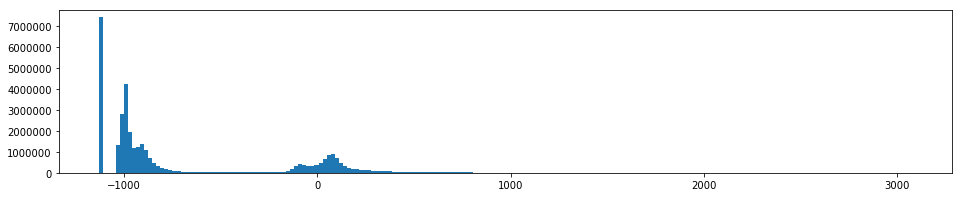

------------------------------------------------------
(512, 512, 133)
Key: 37


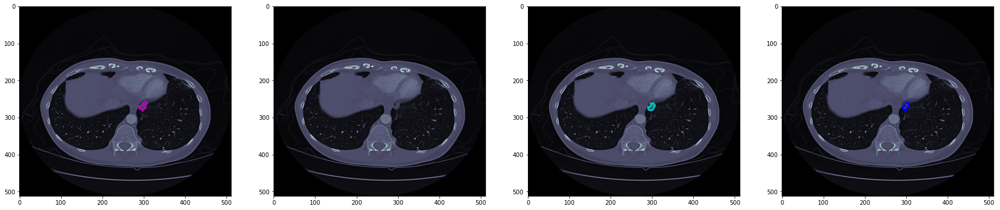

Key: 38


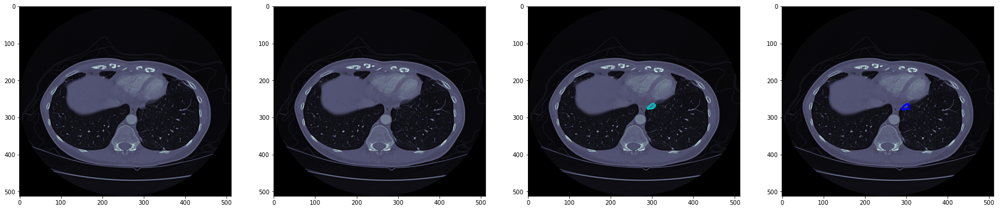

Key: 39


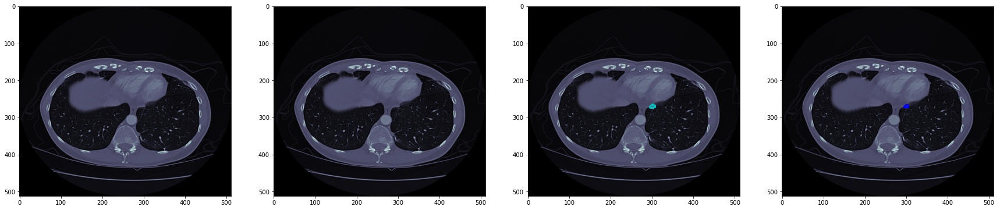

Key: 40


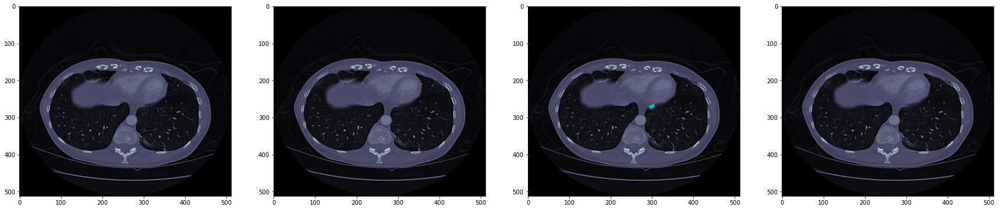

Key: 41


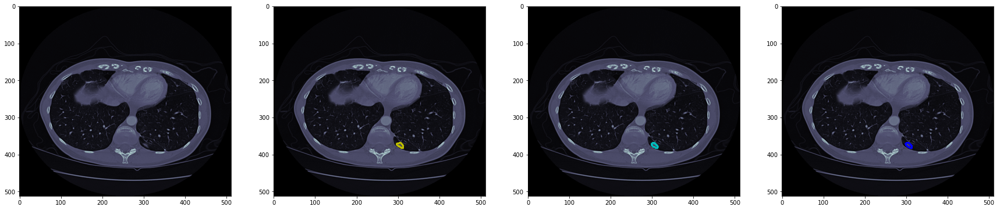

Key: 42


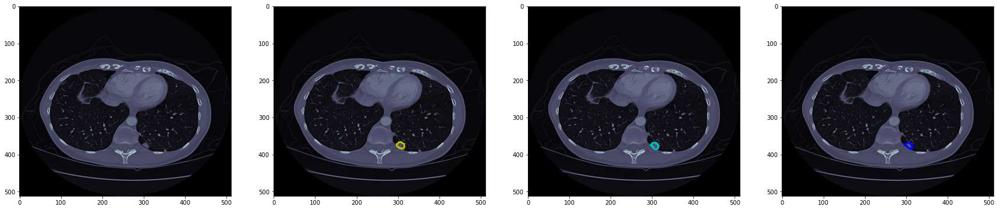

Key: 43


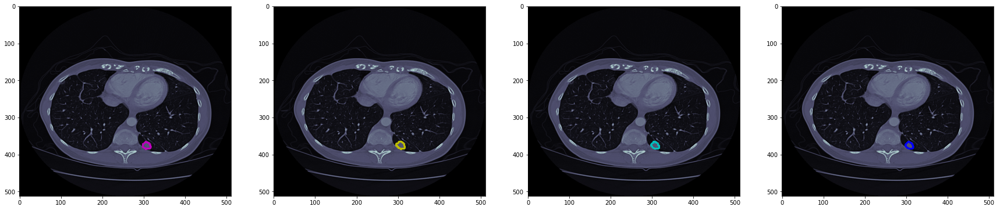

Key: 44


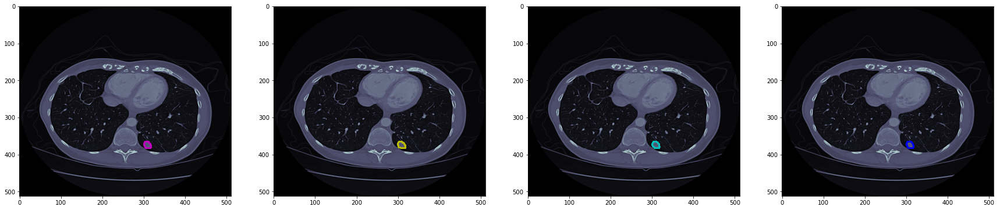

Key: 45


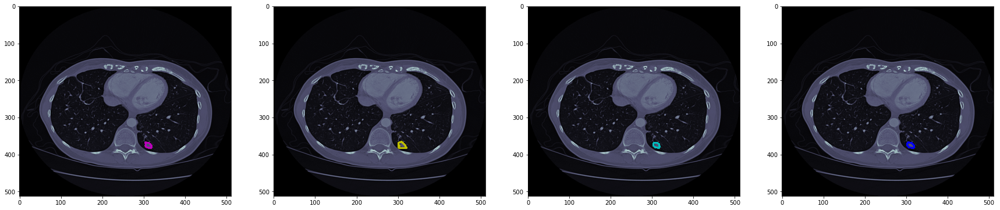

Key: 46


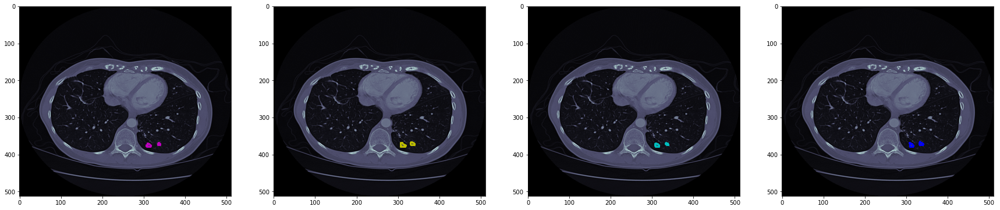

Key: 47


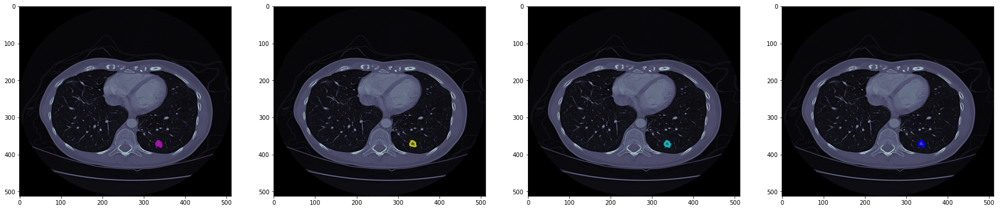

Key: 94


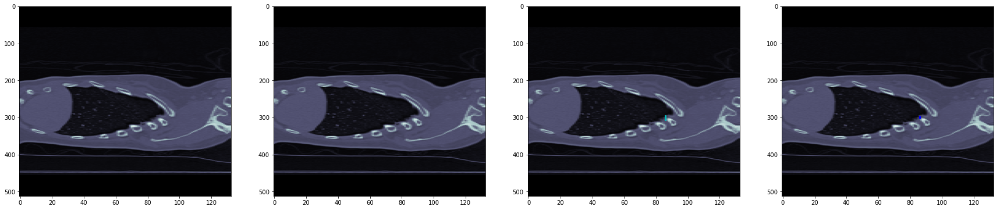

Key: 95


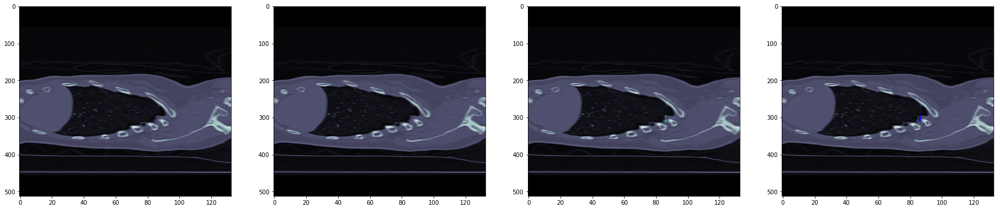

Key: 96


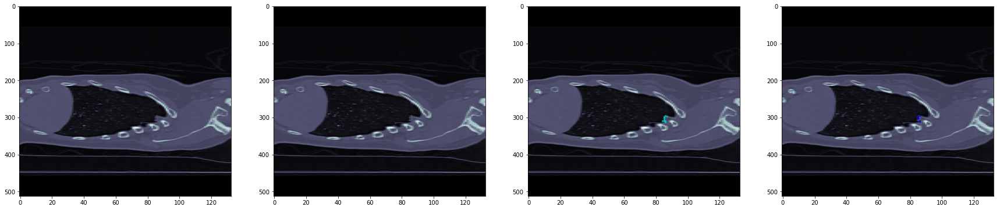

Key: 97


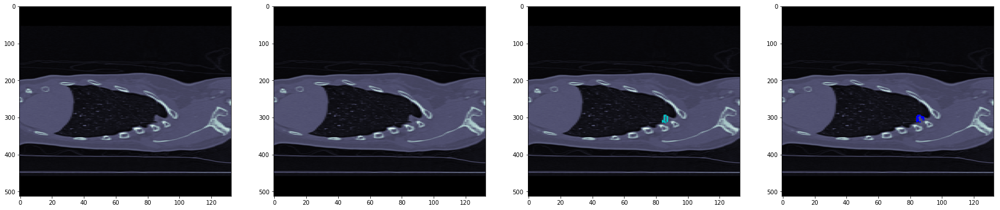

Key: 98


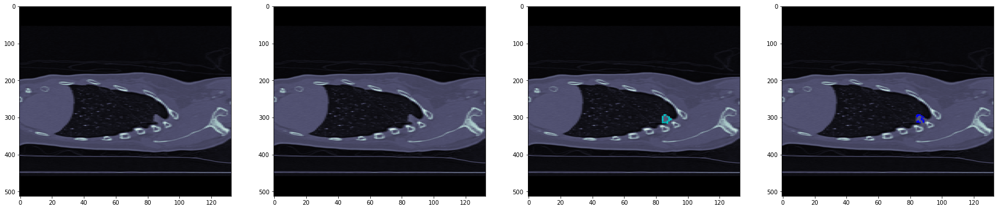

Key: 99


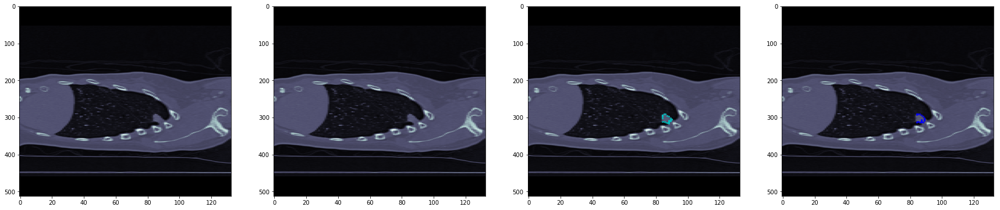

Key: 100


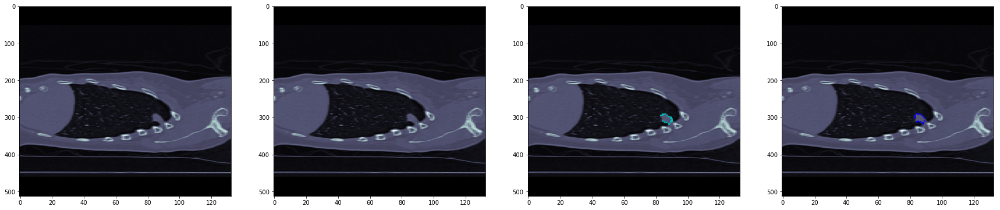

Key: 101


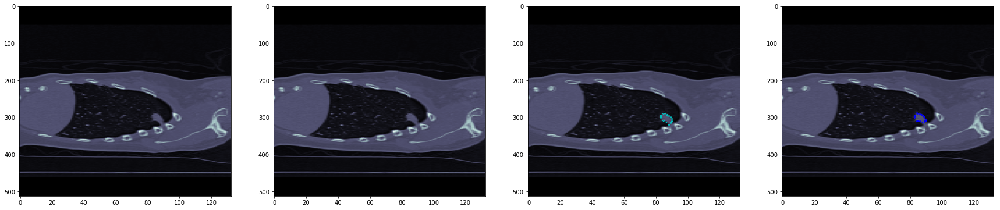

Key: 102


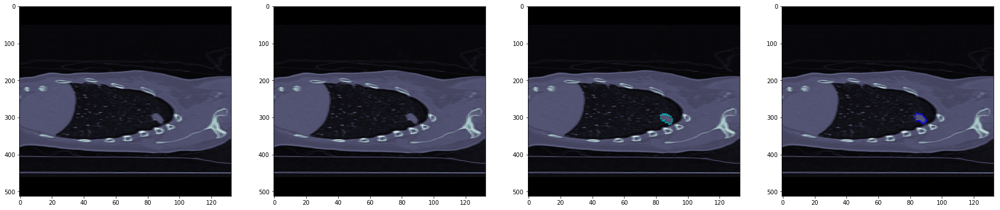

Key: 103


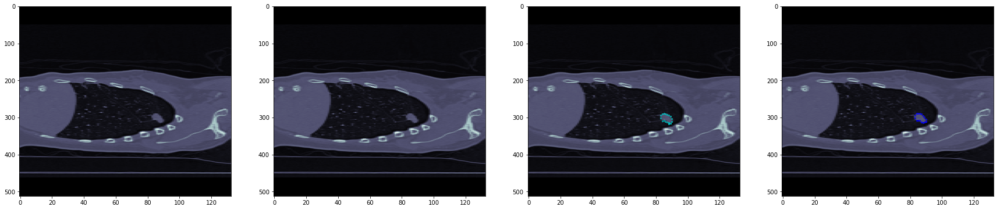

Key: 104


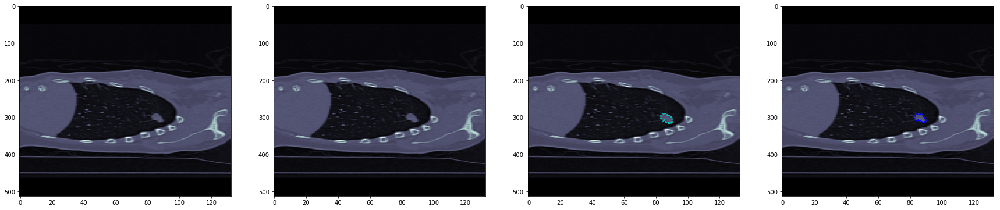

----------------------
Key: 183


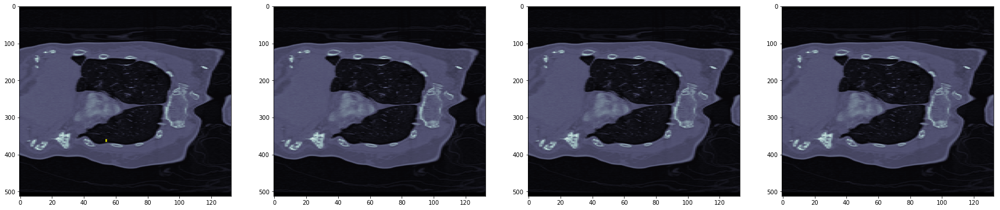

Key: 184


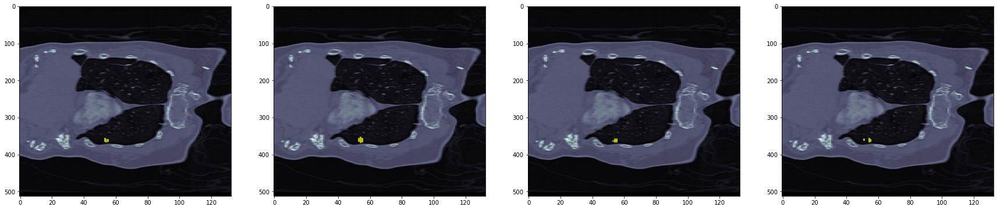

Key: 185


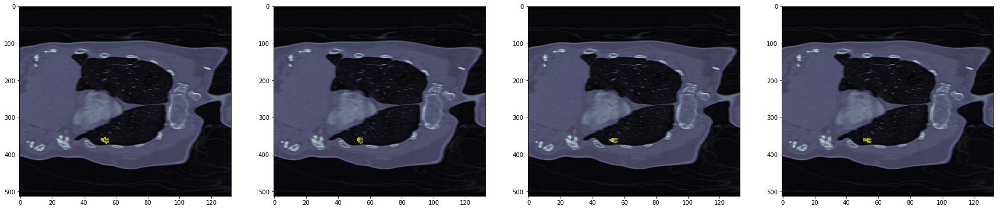

Key: 186


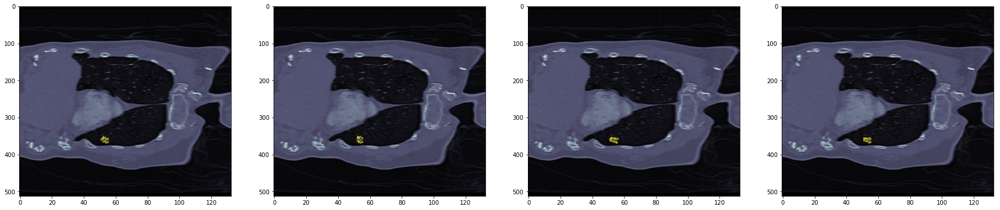

Key: 187


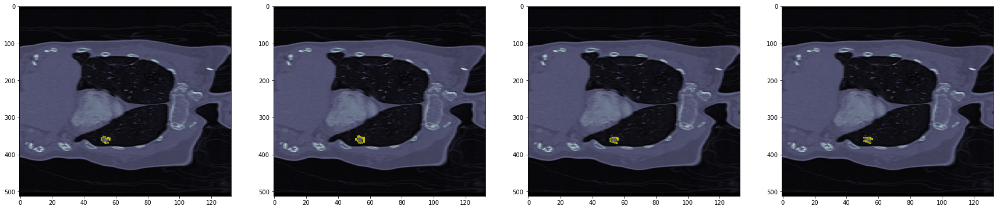

Key: 188


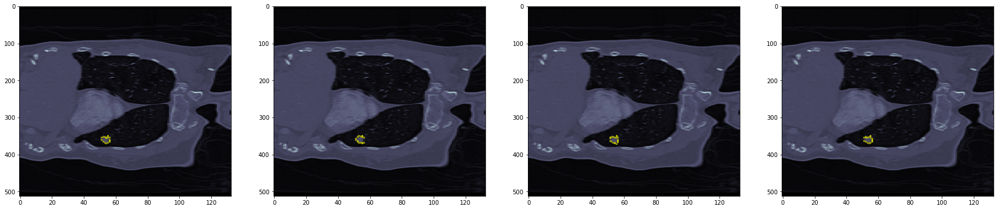

Key: 189


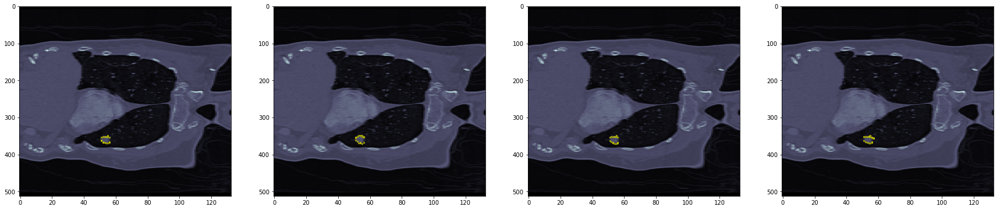

Key: 190


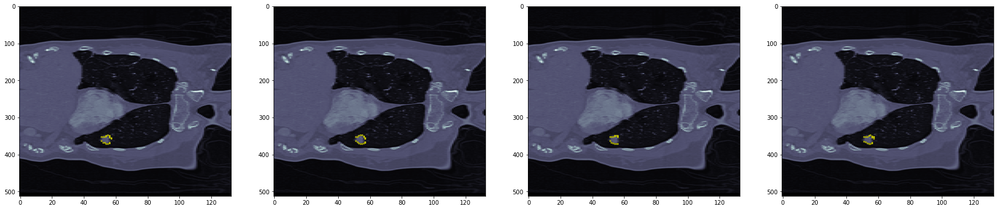

Key: 191


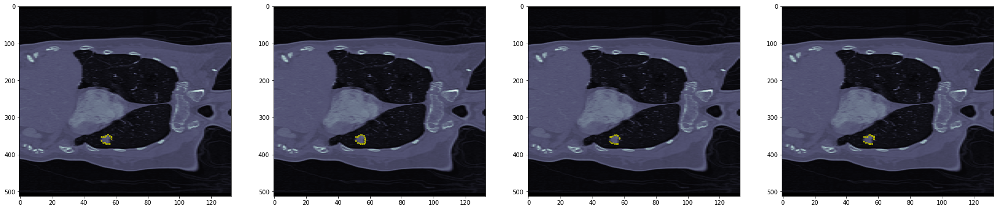

Key: 192


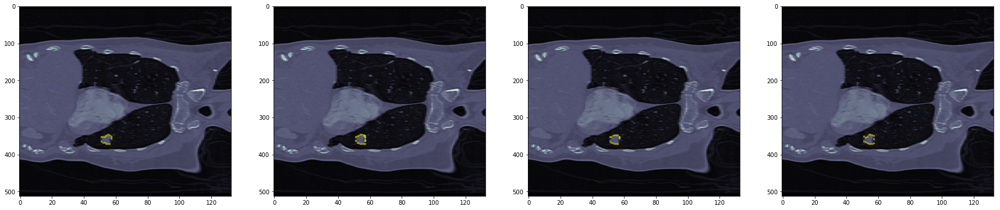

Key: 193


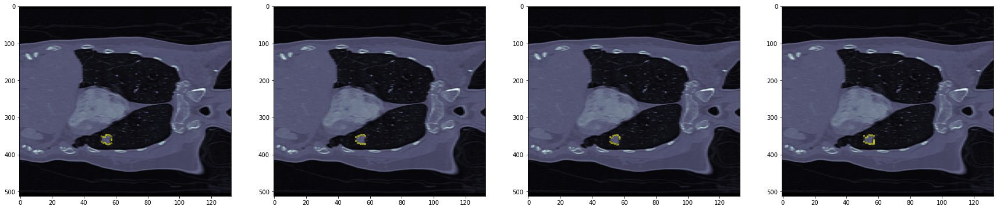

In [7]:


image_3d, keys, dicom_headers = current_series.read_3d_image()
min_z_value = keys[0]    
points = current_series.get_segmentation_points(image_3d, min_z_value, dicom_headers.SliceThickness)

#print dicom_headers
print "------------------------------------------------------"
print "PatientsSex\t", dicom_headers.PatientsSex
try: 
    age = dicom_headers.PatientsAge 
except: 
    age = "None"
print "PatientsAge\t", age
print "SliceThickness\t", dicom_headers.SliceThickness
print "Rows x Columns\t", dicom_headers.Rows, "x" ,dicom_headers.Columns
print "Pixel Spacing\t", dicom_headers.PixelSpacing
print "------------------------------------------------------"

# Plot the histogram of MRI intensity
fig, ax = plt.subplots(1,1,figsize=(16,3))
hist_image_3d = np.ravel(image_3d)
ax.hist(hist_image_3d, bins=200)

plt.show(fig)
print "------------------------------------------------------"


print image_3d.shape

count_max = 10

colors=['m','y','c','b','g','r']
i = 0
for key, seg_points in points.by_z.items():
    #if(89 <key and key<100):
    if(True):
        current_img = image_3d[:,:,key]
        #print current_img.shape
    
        fig, ax = plt.subplots(1,4,figsize=(30, 6))
        ax[0].imshow(current_img, cmap=plt.cm.bone, aspect='auto', interpolation='hanning')
        ax[1].imshow(current_img, cmap=plt.cm.bone, aspect='auto', interpolation='hanning')
        ax[2].imshow(current_img, cmap=plt.cm.bone, aspect='auto', interpolation='hanning')
        ax[3].imshow(current_img, cmap=plt.cm.bone, aspect='auto', interpolation='hanning')

        #print "z",key
        rois_by_specialist = {}
        for point in seg_points:
            if not (point.specialist_index in rois_by_specialist):
                rois_by_specialist[point.specialist_index] = {"rois_x" : [],"rois_y" : []}
            #print point.x ,point.y ,point.z
            rois_by_specialist[point.specialist_index]["rois_x"].append(point.x)
            rois_by_specialist[point.specialist_index]["rois_y"].append(point.y)
        
        print "Key:", key
        for key,value in rois_by_specialist.items():
            ax[key].plot(value["rois_x"],value["rois_y"], 'o',  markersize=2, markerfacecolor='none', markeredgecolor=colors[key])

        plt.show()
        i+=1
        if(i>count_max):
            break


i = 0
for key, seg_points in points.by_x.items():
    #if(330 <key and key<360) or (250 <key and key<270):
    if(True):
        current_img = image_3d[:,key,:]

        fig, ax = plt.subplots(1,4,figsize=(30, 6))
        ax[0].imshow(current_img, cmap=plt.cm.bone, aspect='auto', interpolation='hanning')
        ax[1].imshow(current_img, cmap=plt.cm.bone, aspect='auto', interpolation='hanning')
        ax[2].imshow(current_img, cmap=plt.cm.bone, aspect='auto', interpolation='hanning')
        ax[3].imshow(current_img, cmap=plt.cm.bone, aspect='auto', interpolation='hanning')

        rois_by_specialist = {}
        for point in seg_points:
            if not (point.specialist_index in rois_by_specialist):
                rois_by_specialist[point.specialist_index] = {"rois_x" : [],"rois_y" : []}
            #print point.x ,point.y ,point.z
            rois_by_specialist[point.specialist_index]["rois_x"].append(point.z)
            rois_by_specialist[point.specialist_index]["rois_y"].append(point.y)
            
        print "Key:", key
        for key,value in rois_by_specialist.items():
            ax[key].plot(value["rois_x"],value["rois_y"], 'o',  markersize=2, markerfacecolor='none', markeredgecolor=colors[key])

        plt.show()
        i+=1
        if(i>count_max):
            break
        
print "----------------------"
i = 0
for key, seg_points in points.by_y.items():
    #if(330 <key and key<360) or (250 <key and key<270):
    if(True):
        #why "y" we need to fix the first position?
        current_img = image_3d[key,:,:]
        #print current_img.shape
        
        fig, ax = plt.subplots(1,4,figsize=(30, 6))
        ax[0].imshow(current_img, cmap=plt.cm.bone, aspect='auto', interpolation='hanning')
        ax[1].imshow(current_img, cmap=plt.cm.bone, aspect='auto', interpolation='hanning')
        ax[2].imshow(current_img, cmap=plt.cm.bone, aspect='auto', interpolation='hanning')
        ax[3].imshow(current_img, cmap=plt.cm.bone, aspect='auto', interpolation='hanning')

        rois_by_specialist = {}
        for point in seg_points:
            if not (point.specialist_index in rois_by_specialist):
                rois_by_specialist[point.specialist_index] = {"rois_x" : [],"rois_y" : []}
            #print point.x ,point.y ,point.z
            rois_by_specialist[point.specialist_index]["rois_x"].append(point.z)
            rois_by_specialist[point.specialist_index]["rois_y"].append(point.x)
            
        print "Key:", key
        for key,value in rois_by_specialist.items():
            ax[key].plot(value["rois_x"],value["rois_y"], colors[key]+'o',  markersize=2, markerfacecolor='none', markeredgecolor='y')

        plt.show()
        i+=1
        if(i>count_max):
            break

# Intensity Validation

In [8]:
def close_segmentation(image_3d, points):
    segmentation_3d = np.zeros(image_3d.shape)
    
    for point in points:
        #WHAT IS WRONG HERE?
        segmentation_3d[point.y,point.x,point.z] = 1

    struct1 = ndi.generate_binary_structure(3, 2)

    segmentation_3d_changed = segmentation_3d
    segmentation_3d_changed = ndi.binary_dilation(segmentation_3d_changed, structure=struct1, iterations=5)
    segmentation_3d_changed = ndi.binary_closing(segmentation_3d_changed, structure=struct1)
    segmentation_3d_changed = ndi.binary_erosion(segmentation_3d_changed, structure=struct1, iterations=5)
    
    return segmentation_3d_changed

def apply_segmentation_mask(image_3d,segmentation_3d_changed):
    np_where_result = np.where(segmentation_3d_changed ==1, image_3d,float('nan'))

    return np_where_result


(512, 512, 133) (512, 512, 133) (512, 512, 133)
[[[ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  ..., 
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]]

 [[ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  ..., 
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]]

 [[ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  ..., 
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]]

 ..., 
 [[ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  ..., 
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  n

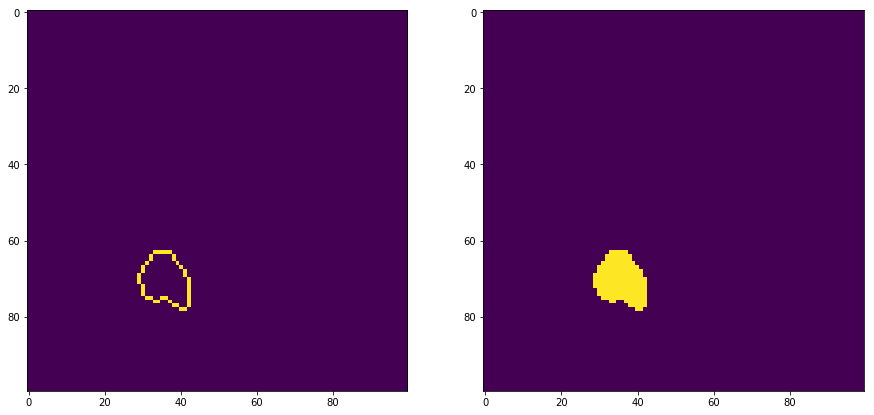

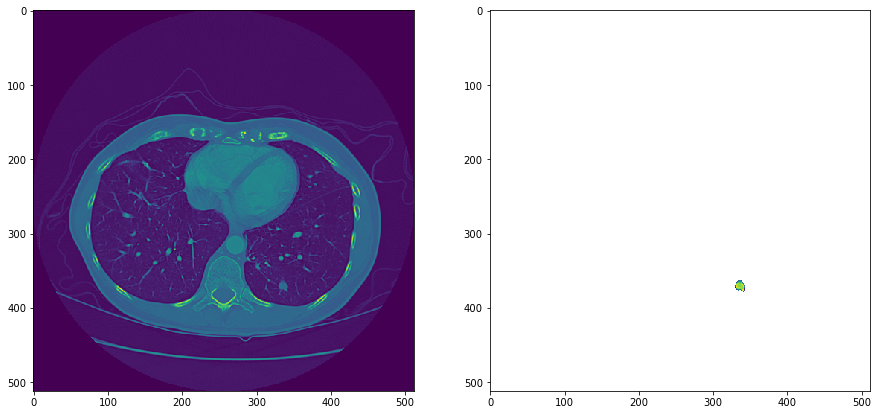

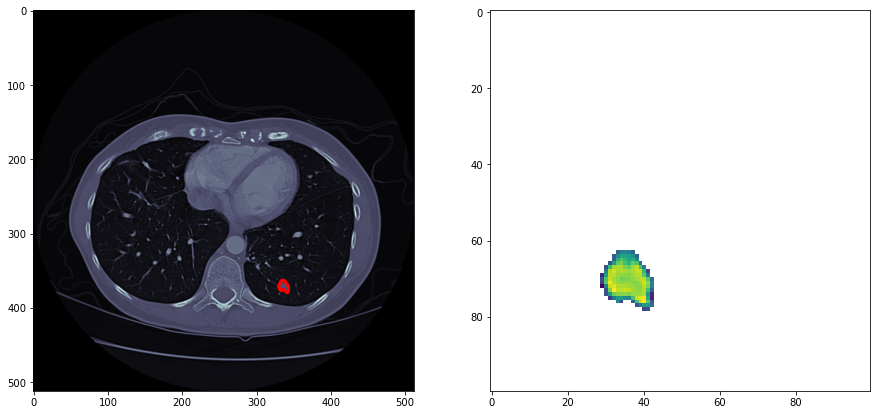

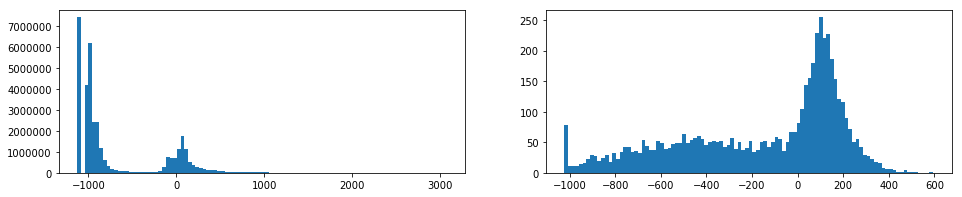

------------------------------------------------------
(512, 512, 133) (512, 512, 133) (512, 512, 133)
[[[ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  ..., 
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]]

 [[ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  ..., 
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]]

 [[ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  ..., 
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]]

 ..., 
 [[ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  ..., 
  [ nan  nan  nan ...,  nan  nan 

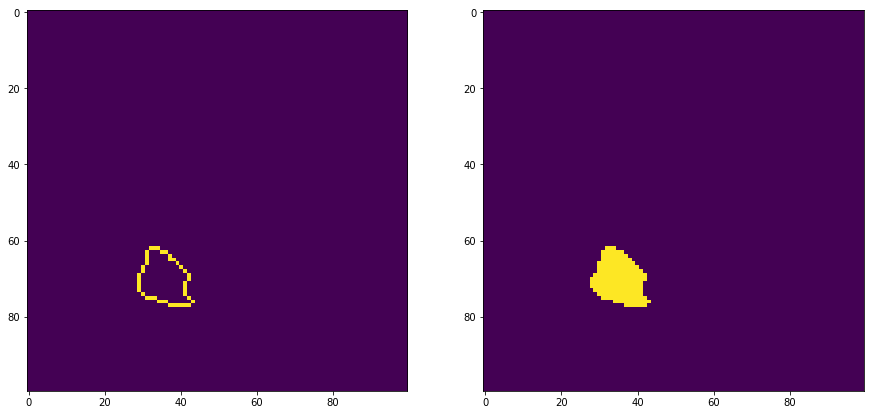

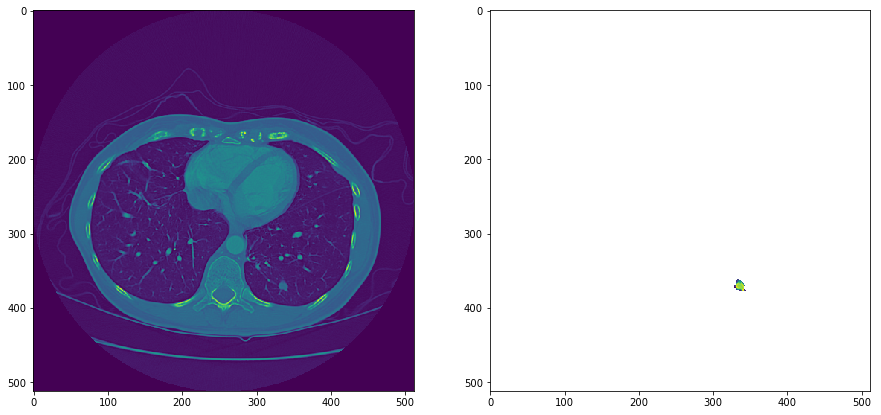

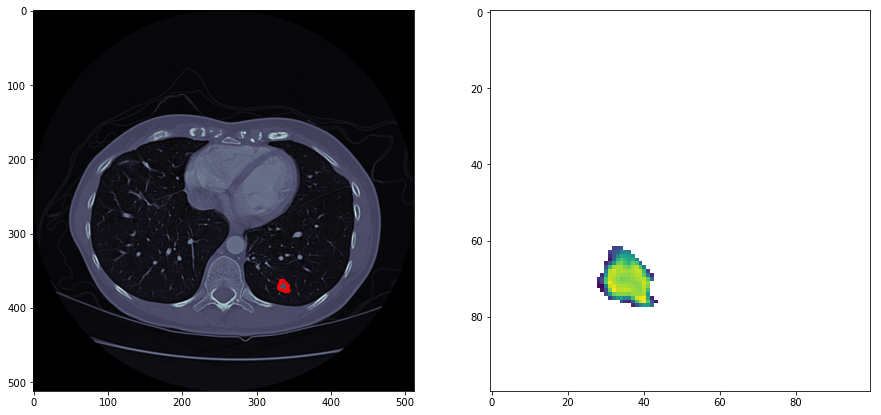

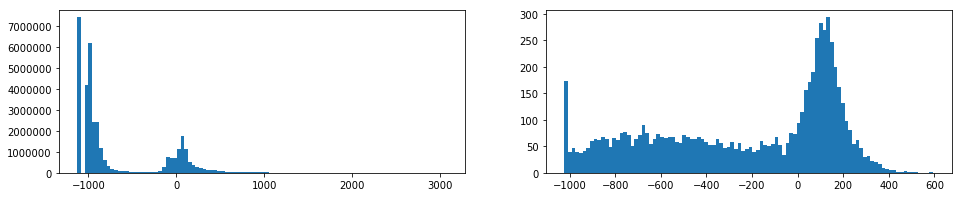

------------------------------------------------------
(512, 512, 133) (512, 512, 133) (512, 512, 133)
[[[ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  ..., 
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]]

 [[ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  ..., 
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]]

 [[ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  ..., 
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]]

 ..., 
 [[ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  ..., 
  [ nan  nan  nan ...,  nan  nan 

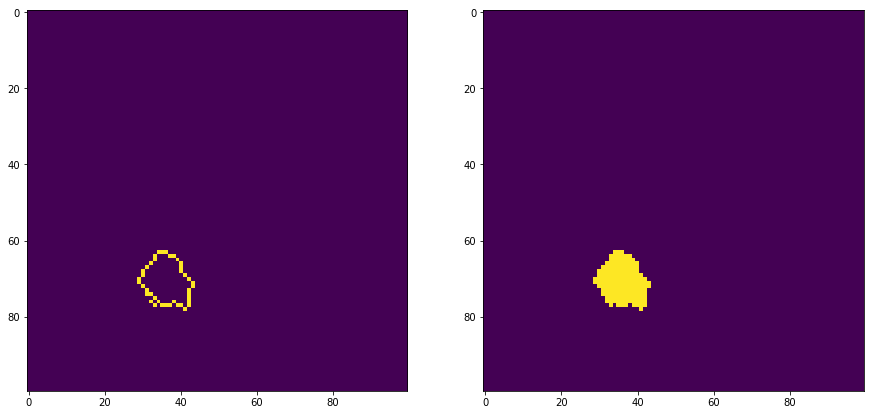

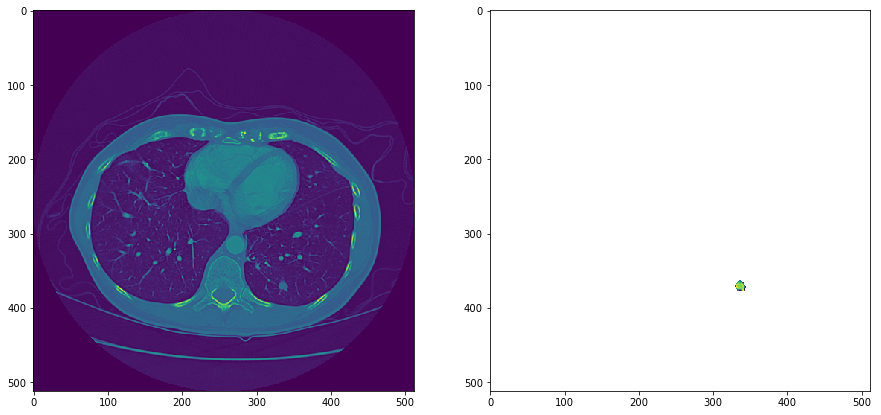

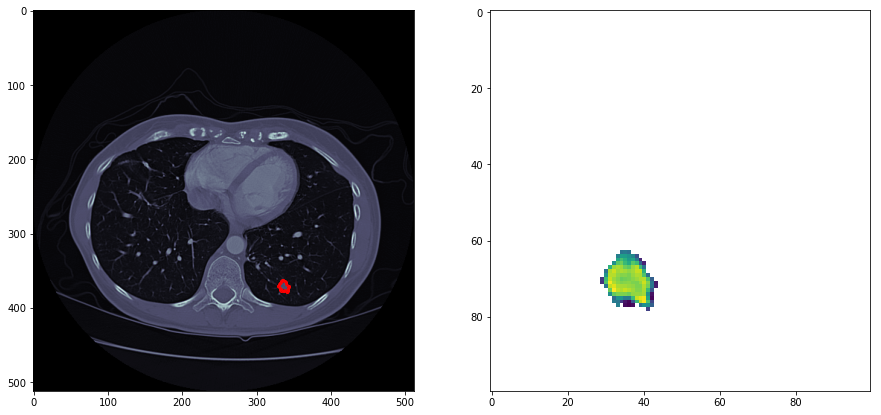

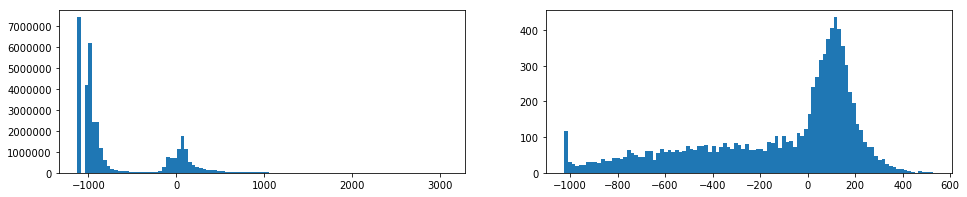

------------------------------------------------------
(512, 512, 133) (512, 512, 133) (512, 512, 133)
[[[ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  ..., 
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]]

 [[ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  ..., 
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]]

 [[ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  ..., 
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]]

 ..., 
 [[ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  [ nan  nan  nan ...,  nan  nan  nan]
  ..., 
  [ nan  nan  nan ...,  nan  nan 

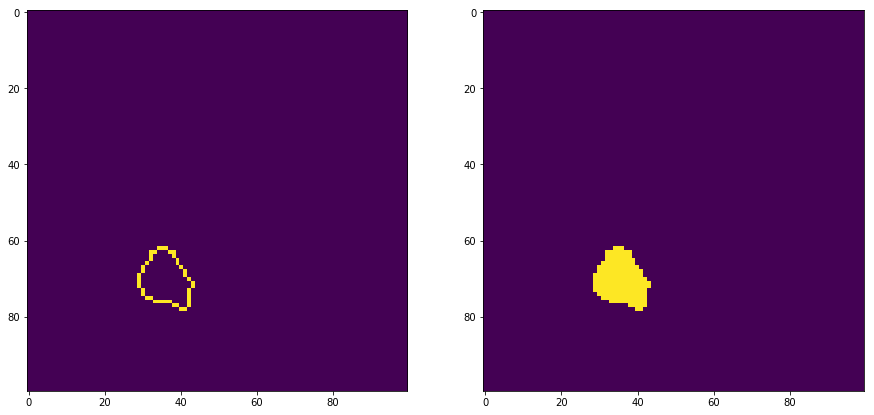

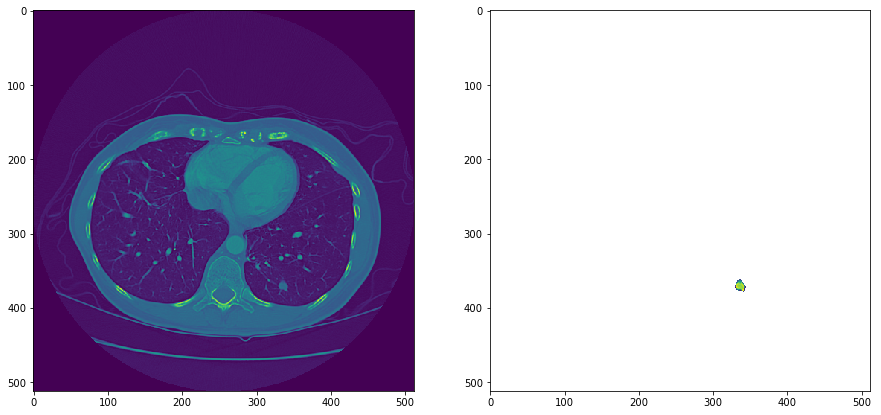

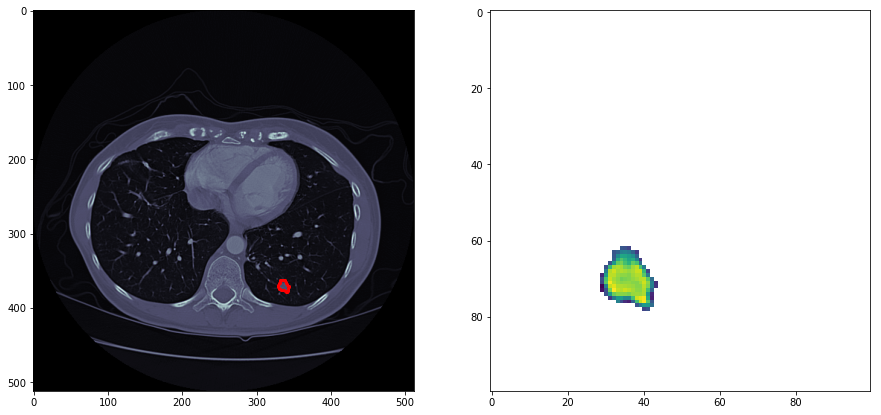

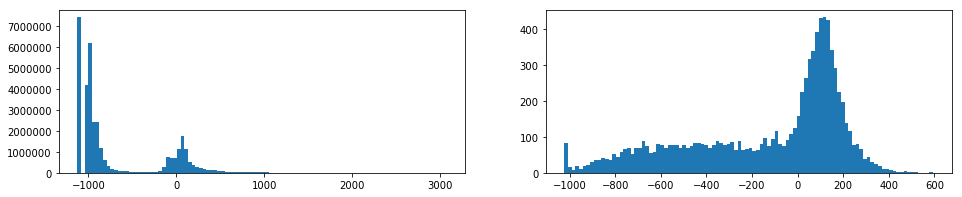

------------------------------------------------------


In [9]:
image_3d, keys, dicom_headers = current_series.read_3d_image()
min_z_value = keys[0]    
points = current_series.get_segmentation_points(image_3d, min_z_value, dicom_headers.SliceThickness)


i = 0
z_index = 47


for i,specialist_points in points.by_specialist.items():
    try:
        segmentation_3d = np.zeros(image_3d.shape)

        for point in specialist_points:
            #WHAT IS WRONG HERE?
            segmentation_3d[point.y,point.x,point.z] = 1

        segmentation_3d_changed = close_segmentation(image_3d,specialist_points)
        img_segmentation_3d = apply_segmentation_mask(image_3d,segmentation_3d_changed)

        print segmentation_3d_changed.shape,image_3d.shape,img_segmentation_3d.shape
        print img_segmentation_3d

        fig, ax = plt.subplots(1,2,figsize=(15,30))

        ax[0].imshow(segmentation_3d[300:400,300:400,z_index])
        ax[1].imshow(segmentation_3d_changed[300:400,300:400,z_index])
        plt.show()

        fig, ax = plt.subplots(1,2,figsize=(15,30))

        ax[0].imshow(image_3d[:,:,z_index])
        ax[1].imshow(img_segmentation_3d[:,:,z_index])

        plt.show()

        fig, ax = plt.subplots(1,2,figsize=(15,30))

        seg_points = points.by_z[z_index]
        current_img = image_3d[:,:,z_index]
        rois_x=[]
        rois_y=[]
        for point in seg_points:
            if point.specialist_index == i:
                rois_x.append(point.x)
                rois_y.append(point.y)
        ax[0].imshow(current_img, cmap=plt.cm.bone, interpolation='hanning')
        ax[0].plot(rois_x,rois_y, 'ro',  markersize=2, markerfacecolor='none', markeredgecolor='r')

        ax[1].imshow(img_segmentation_3d[300:400,300:400,z_index])

        plt.show()

        # Plot the histogram of MRI intensity
        fig, ax = plt.subplots(1,2,figsize=(16,3))
        hist_image_3d = np.ravel(image_3d)
        ax[0].hist(hist_image_3d, bins=100)

        hist_segmentation_3d = img_segmentation_3d[~np.isnan(img_segmentation_3d)]
        ax[1].hist(hist_segmentation_3d, bins=100)

        plt.show(fig)
        print "------------------------------------------------------"
    except:
        print current_series.xml_path
        print "Unexpected error:", sys.exc_info()[0]



# Test 3D image

In [17]:
def get_gradient_image(image_3d):
    gradient_dx,gradient_dy,gradient_dz = np.gradient(image_3d)

    return np.sqrt(gradient_dx**2 + gradient_dy**2 + gradient_dz**2), gradient_dx,gradient_dy,gradient_dz

def check_progress(markers,z_slice,user_points):
    plot_x=[]
    plot_y=[]

    for m in markers:
        if(m[2] == z_slice):
            plot_x.append(m[0])
            plot_y.append(m[1])
    fig, ax = plt.subplots(1,2,figsize=(15,8))
    ax[0].imshow(gradient_image[:,:,z_slice], cmap=plt.cm.bone, aspect='auto')
    for user_point in user_points:
        ax[0].plot(user_point[0],user_point[1],'+', mew=2,color='red')
    
    ax[1].imshow(gradient_image[:,:,z_slice], cmap=plt.cm.bone, aspect='auto')
    ax[1].plot(plot_x,plot_y,'+',color='green', mew=2)

    plt.show()
    

def try_append(x,y,z,markers_queued_list,markers_queue):
    if((x,y,z) not in markers_queued_list):
        markers_queue.put((x,y,z))
        markers_queued_list[(x,y,z)] = True
        

def get_watershed_marker_points(gradient_image, gradient_dx, gradient_dy, gradient_dz, user_points,  neighborhood = 1, delta_gradient = 3, limit_iterations = 40000, progress_enabled=True):
    gradient_direction = [gradient_dx, gradient_dy, gradient_dz]/gradient_image
        
    markers=[]
    markers_queue = Queue()
    markers_queued_list = {}
    
    # Put the first marker = user point
    for user_point in user_points:
        try_append(user_point[0],  user_point[1], user_point[2],  markers_queued_list, markers_queue)
    # Control Variables
    current_iteration = 0
    
    while markers_queue.qsize() > 0 and current_iteration < limit_iterations:
        current_iteration+=1

        marker = markers_queue.get()
        marker_point = (marker[0],marker[1],marker[2])
        markers.append(marker_point)

        if progress_enabled and current_iteration % 100 == 0: check_progress(markers,z_index,user_points)
        # Intensity Validation full
        
        x = marker[0]
        y = marker[1]
        z = marker[2]
    
        x_direction = gradient_direction[0,marker[0],marker[1],marker[2]]
        y_direction = gradient_direction[1,marker[0],marker[1],marker[2]]
        z_direction = gradient_direction[2,marker[0],marker[1],marker[2]]

        delta_direction = 0

        next_xs=[]
        if x_direction >= delta_direction: 
            next_xs.append(x + 1) 
        elif x_direction >=  - delta_direction: 
            next_xs.append(x + 1) 
            next_xs.append(x - 1) 
        else:
            next_xs.append(x - 1)
            
        next_ys=[]
        if y_direction >= delta_direction: 
            next_ys.append(y + 1) 
        elif y_direction >=  - delta_direction: 
            next_ys.append(y + 1) 
            next_ys.append(y - 1) 
        else:
            next_ys.append(y - 1)
            
        next_zs=[]
        if z_direction >= delta_direction: 
            next_zs.append(z + 1) 
        elif z_direction >=  - delta_direction: 
            next_zs.append(z + 1) 
            next_zs.append(z - 1) 
        else:
            next_zs.append(z - 1)
            
        for next_x in next_xs:
            for next_y in next_ys:
                for next_z in next_zs:
                    try_append(next_x,next_y,next_z,markers_queued_list,markers_queue)
        
    return markers, current_iteration


In [11]:
def get_watershed_marker(markers, shape):
    image_markers = np.zeros(shape)
    all_x=[]
    all_y=[]
    all_z=[]
    for m in markers:
        image_markers[m[1],m[0],m[2]] = 1
        all_x.append(m[1])
        all_y.append(m[0])
        all_z.append(m[2])
    struct_3d = ndi.generate_binary_structure(3, 2)

    fig, ax = plt.subplots(2,2,figsize=(15,15))
    #ax[0,0].imshow(image_markers[:,:,user_points[0][2]], cmap=plt.cm.bone, aspect='auto')
    #ax[0,0].plot(user_point[0],user_point[1],'+', mew=2,color='red')

    image_markers_closed = image_markers
    image_markers_closed = ndi.binary_dilation(image_markers_closed, structure=struct_3d, iterations=3)
    #ax[0,1].imshow(image_markers_closed[:,:,user_points[0][2]], cmap=plt.cm.bone, aspect='auto')

    image_markers_closed = ndi.binary_closing(image_markers_closed, structure=struct_3d)
    #ax[1,0].imshow(image_markers_closed[:,:,user_points[0][2]], cmap=plt.cm.bone, aspect='auto')

    image_markers_closed = ndi.binary_erosion(image_markers_closed, structure=struct_3d, iterations=2)
    #ax[1,1].imshow(image_markers_closed[:,:,user_points[0][2]], cmap=plt.cm.bone, aspect='auto')

    #plt.show()

    internal_markers = ndi.binary_erosion(image_markers_closed, structure=struct_3d, iterations=1)

    external_markers_a = ndi.binary_dilation(image_markers_closed, structure=struct_3d, iterations=2)
    external_markers_b = ndi.binary_dilation(image_markers_closed, structure=struct_3d, iterations=20)

    external_markers = external_markers_b ^ external_markers_a

    marker_watershed = np.zeros(image_markers.shape, dtype=np.int)
    marker_watershed += internal_markers * 255
    marker_watershed += external_markers * 128
    
    return marker_watershed,all_x,all_y,all_z


# Statistics

In [12]:
def generate_user_point(image_3d,segmentation_points):
    segmentation_3d = np.zeros(image_3d.shape)

    points_x =[]
    points_y =[]
    points_z =[]
    
    for point in segmentation_points:
        points_x.append(point.x)
        points_y.append(point.y)
        points_z.append(point.z)
    
    min_x = np.min(points_x)
    min_y = np.min(points_y)
    min_z = np.min(points_z)
    
    max_x = np.max(points_x)
    max_y = np.max(points_y)
    max_z = np.max(points_z)
    
    x = (max_x - min_x) / 2 + min_x
    y = (max_y - min_y) / 2 + min_y
    z = (max_z - min_z) / 2 + min_z
    r = np.min([max_x - min_x,max_y - min_y,max_z - min_z])
    
    
    return (x,y,z,r)


/home/usuario/imagens-medicas/lidc/LIDC-IDRI/LIDC-IDRI-0283/1.3.6.1.4.1.14519.5.2.1.6279.6001.150518738304733101418007977406/1.3.6.1.4.1.14519.5.2.1.6279.6001.150097650621090951325113116280/014.xml
Nodule 0
[(310, 266, 79), (313, 266, 79), (312, 267, 80), (310, 268, 81), (308, 268, 81), (307, 267, 80), (307, 264, 77), (308, 263, 76), (310, 263, 76), (312, 264, 77), (313, 266, 79)]
Nodule 174244
[(310, 266, 79), (313, 266, 79), (312, 267, 80), (310, 268, 81), (308, 268, 81), (307, 267, 80), (307, 264, 77), (308, 263, 76), (310, 263, 76), (312, 264, 77), (313, 266, 79), (309, 267, 79), (313, 267, 79), (312, 269, 81), (309, 270, 82), (307, 270, 82), (305, 268, 80), (305, 265, 77), (307, 263, 75), (309, 263, 75), (312, 264, 76), (313, 267, 79)]
Nodule Nodule 002
[(310, 266, 79), (313, 266, 79), (312, 267, 80), (310, 268, 81), (308, 268, 81), (307, 267, 80), (307, 264, 77), (308, 263, 76), (310, 263, 76), (312, 264, 77), (313, 266, 79), (309, 267, 79), (313, 267, 79), (312, 269, 81), (309, 

/home/usuario/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in divide


Cropping image
Specialist 0
z 79


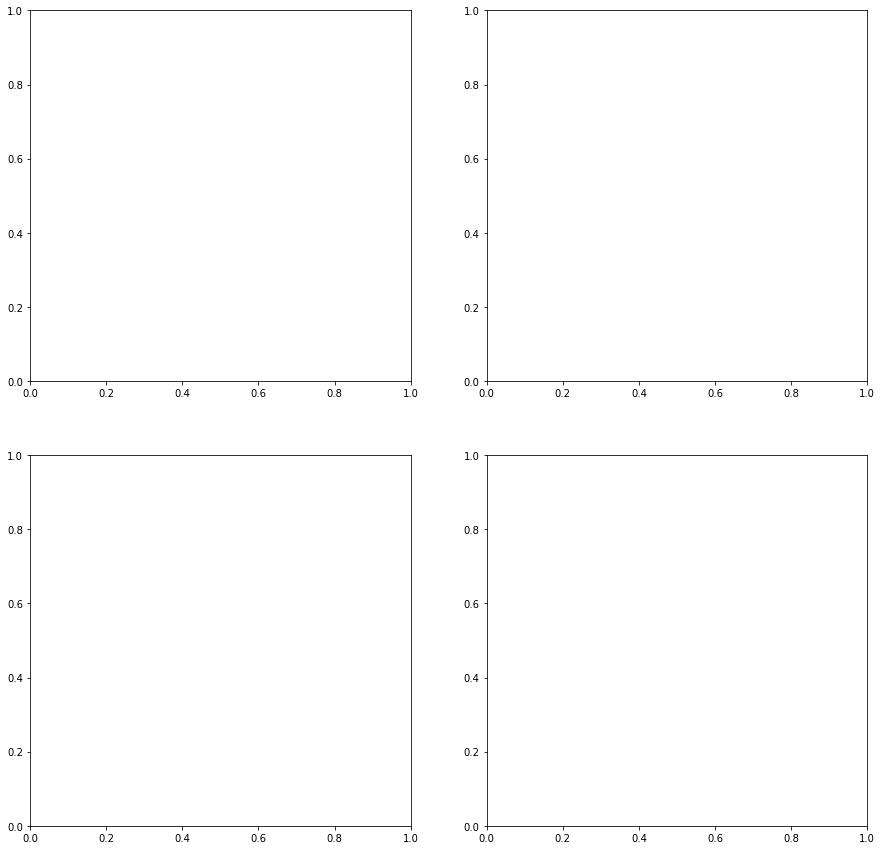

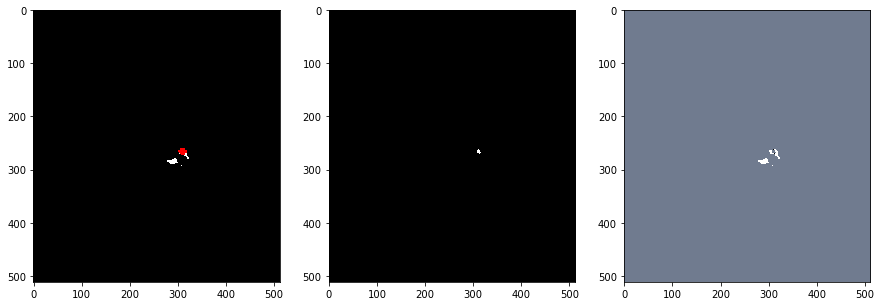

30146560 3298 0.000109398883322


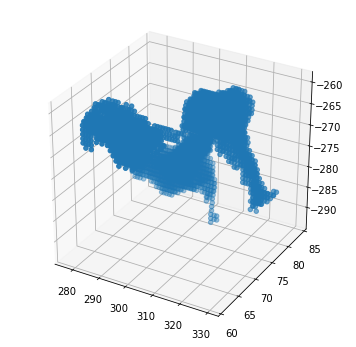

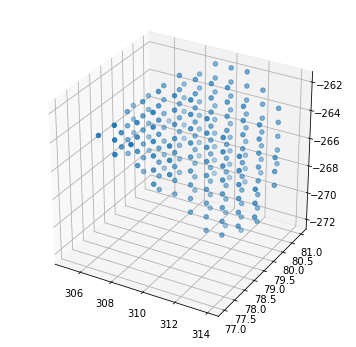

Specialist 1
z 79


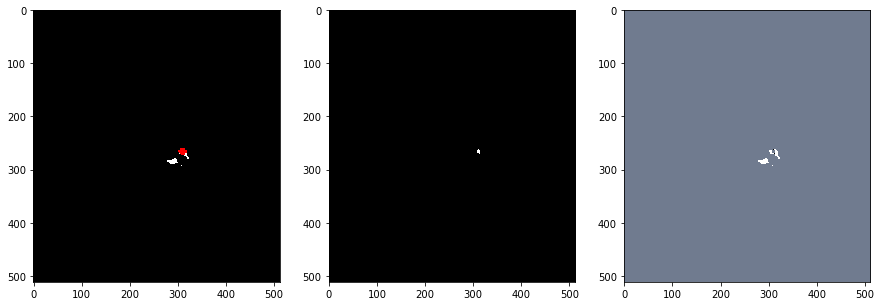

30146560 3326 0.000110327679178


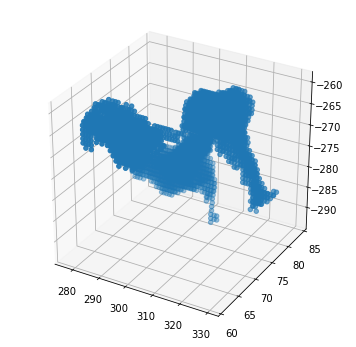

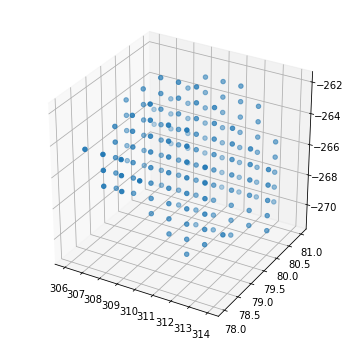

Specialist 2
z 79


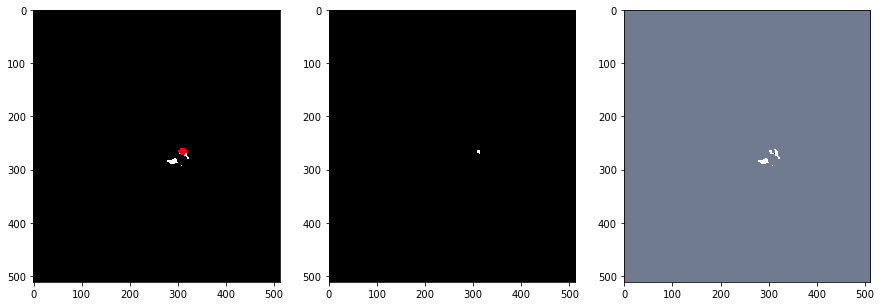

30146560 3330 0.0001104603643


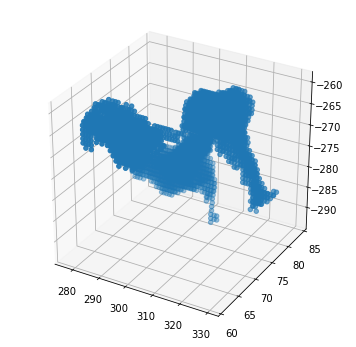

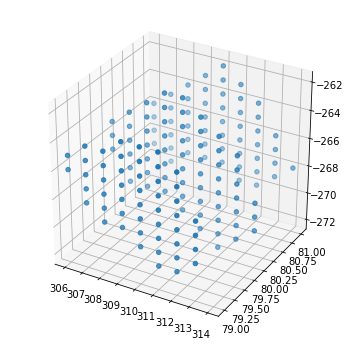

Specialist 3
z 79


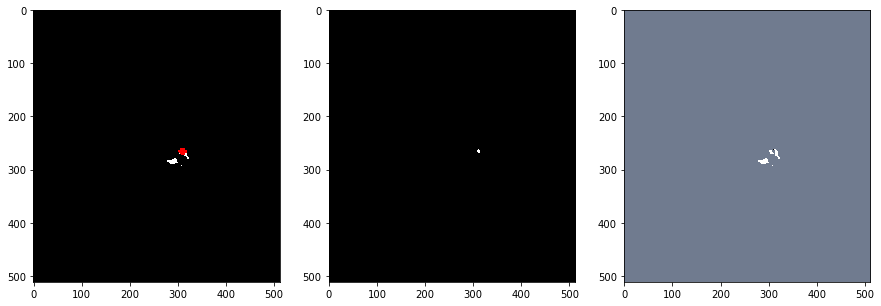

30146560 3334 0.000110593049423


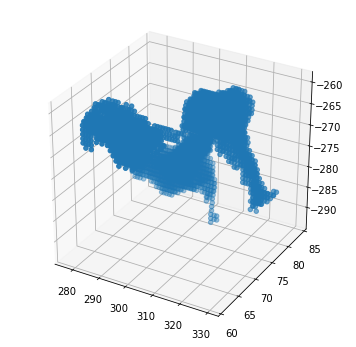

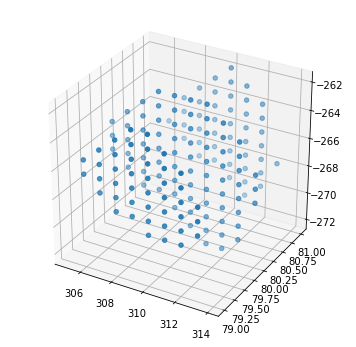

In [13]:
for series_i in series_of_interest[0:1]: 
    print series_i.xml_path
    image_3d, keys, dicom_headers = series_i.read_3d_image()
    min_z_value = keys[0]    
    segmentation_points = series_i.get_segmentation_points(image_3d, min_z_value, dicom_headers.SliceThickness)

    image_3d_filtered = ndi.gaussian_filter(image_3d, sigma=3)
    gradient_image,gradient_dx,gradient_dy,gradient_dz =get_gradient_image(image_3d_filtered)
    
    watershed_result = np.zeros(image_3d.shape)
    user_points = []
    for i,nodule_points in segmentation_points.by_nodule.items():
        print "Nodule", i
        init_point = generate_user_point(image_3d, nodule_points)
        user_points.append((init_point[0],init_point[1],init_point[2]))

        r = init_point[3]
        s = np.linspace(0, 2*np.pi, 10)
        x = init_point[0] + r*np.cos(s)
        y = init_point[1] + r*np.sin(s)
        z = init_point[2] + r*np.sin(s)
        for i in range(0,len(x)):
            user_points.append((int(x[i]),int(y[i]), int(z[i])))
        
    markers,iterations = get_watershed_marker_points(gradient_image, gradient_dx, gradient_dy, gradient_dz, user_points, progress_enabled=False)

    print "Cropping image"
    watershed_marker,all_x,all_y,all_z = get_watershed_marker(markers,image_3d.shape)
    border = 30
    
    min_x = np.minimum(np.amin(all_x) - border,0)
    max_x = np.maximum(np.amax(all_x) + border,image_3d.shape[0])
    min_y = np.minimum(np.amin(all_y) - border,0)
    max_y = np.maximum(np.amax(all_y) + border,image_3d.shape[1])
    min_z = np.minimum(np.amin(all_z) - border,0)
    max_z = np.maximum(np.amax(all_z) + border,image_3d.shape[2])
    
    image_watershed = np.zeros(image_3d.shape)
    image_watershed[min_x:max_x,min_y:max_y,min_z:max_z] = watershed(gradient_image[min_x:max_x,min_y:max_y,min_z:max_z], watershed_marker[min_x:max_x,min_y:max_y,min_z:max_z])

    image_watershed_filtered = np.where(image_watershed >128, image_3d,float('nan'))
    watershed_points = np.where(np.isnan(image_watershed_filtered),0,1)
    watershed_result = watershed_result + watershed_points
    
    for i,specialist_points in segmentation_points.by_specialist.items():
        print "Specialist", i
        segmentation_3d = np.zeros(image_3d.shape)

        for point in specialist_points:
            #WHAT IS WRONG HERE?
            segmentation_3d[point.y,point.x,point.z] = 1

        segmentation_3d_changed = close_segmentation(image_3d,specialist_points)
        img_segmentation_3d = apply_segmentation_mask(image_3d,segmentation_3d_changed)
        size = image_3d.size
        
        segmentation_points = np.where(np.isnan(img_segmentation_3d),0,1)

        diff_image = watershed_result - segmentation_points
        print "z", user_points[0][2]
        fig, ax = plt.subplots(1,3,figsize=(15,5))
        ax[0].imshow(watershed_result[:,:,user_points[0][2]], cmap=plt.cm.bone, aspect='auto')
        for user_point in user_points:
            if user_point[2] == user_points[0][2]:
                ax[0].plot(user_point[0],user_point[1],'+', mew=2,color='red')
        ax[1].imshow(segmentation_points[:,:,user_points[0][2]], cmap=plt.cm.bone, aspect='auto')
        
        #for marker in markers:
            #if marker[2] == user_points[0][2]:
                #ax[0].plot(marker[0],marker[1],'+', mew=2,color='cyan')
        ax[2].imshow(diff_image[:,:,user_points[0][2]], cmap=plt.cm.bone, aspect='auto')
        plt.show()
        
        diff = np.count_nonzero(diff_image)
        print size,diff,diff/float(size)  
                       
        
        fig = plt.figure(figsize=(6,6))
        ax = fig.add_subplot(111, projection='3d')

        z,x,y = watershed_result.nonzero()
        ax.scatter(x, y, -z, zdir='z')
        plt.show()
                       
        fig = plt.figure(figsize=(6,6))
        ax = fig.add_subplot(111, projection='3d')

        z,x,y = segmentation_points.nonzero()
        ax.scatter(x, y, -z, zdir='z')
        plt.show()

# Fixing one image

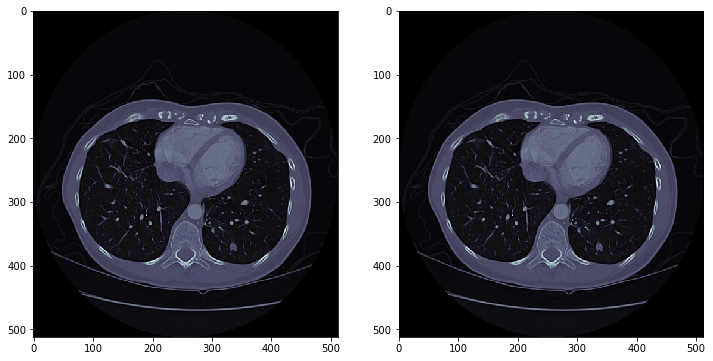

[(335, 370, 47), (340, 370, 47), (338, 373, 47), (335, 374, 47), (332, 374, 47), (330, 371, 47), (330, 368, 47), (332, 365, 47), (335, 365, 47), (338, 366, 47), (340, 370, 47)]


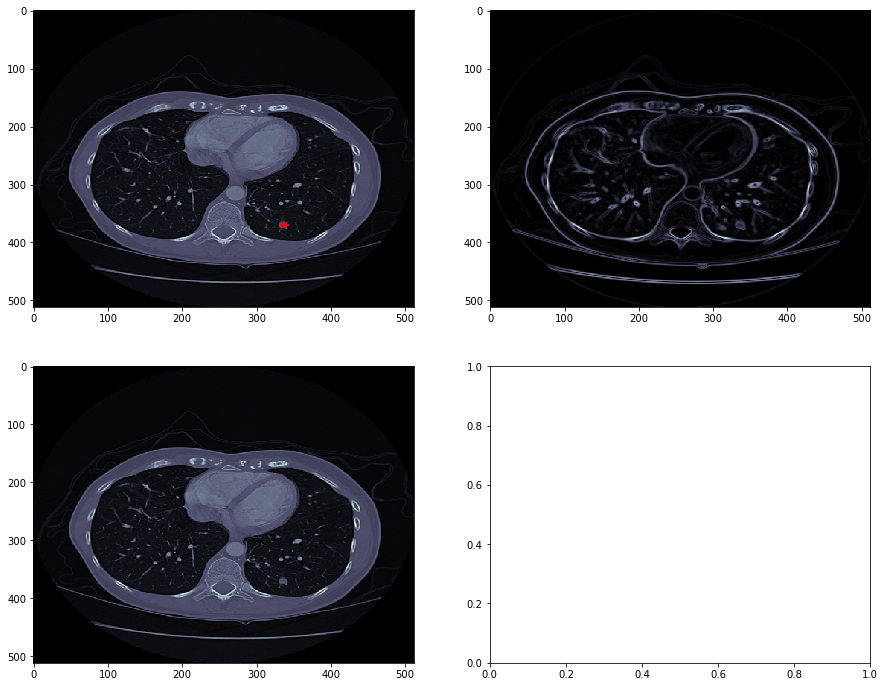

/home/usuario/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in divide


========== FINISHED! ==========
Iterations:  45
Markers:  45


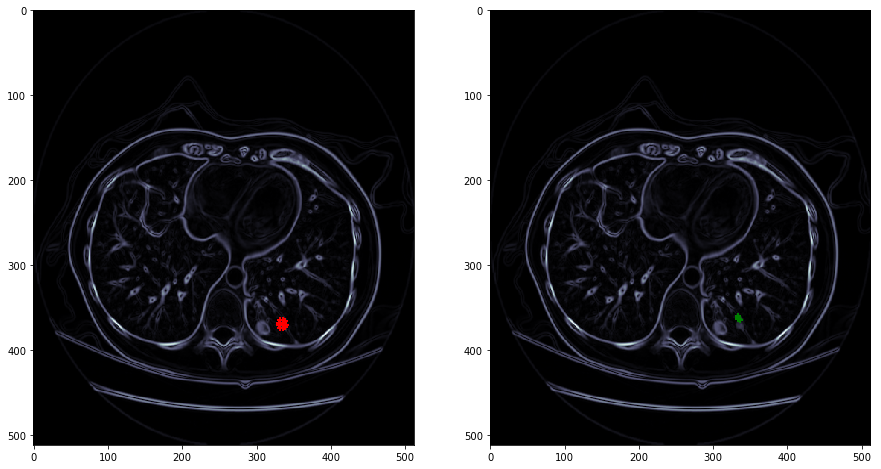

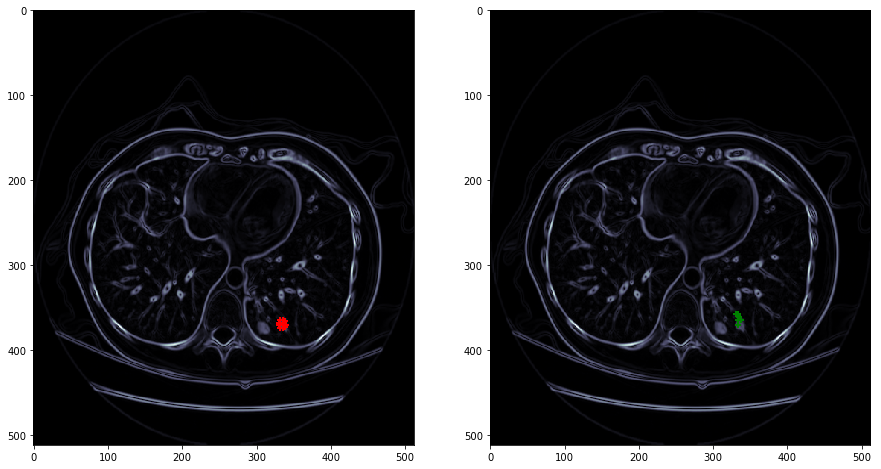

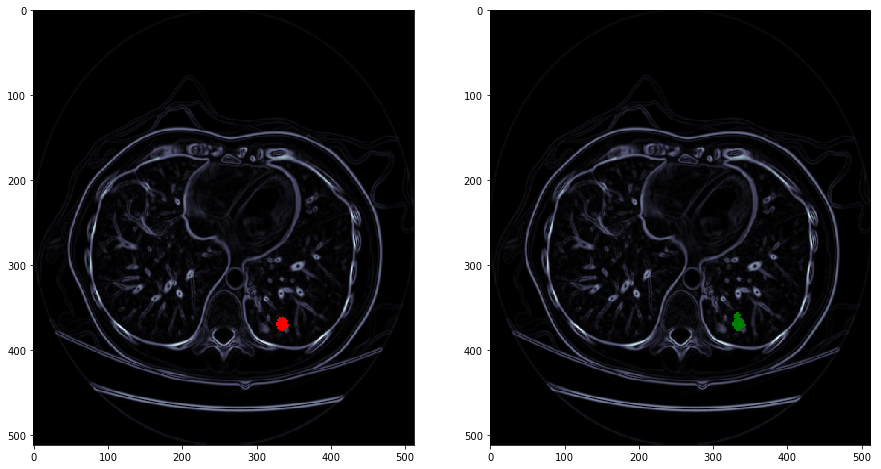

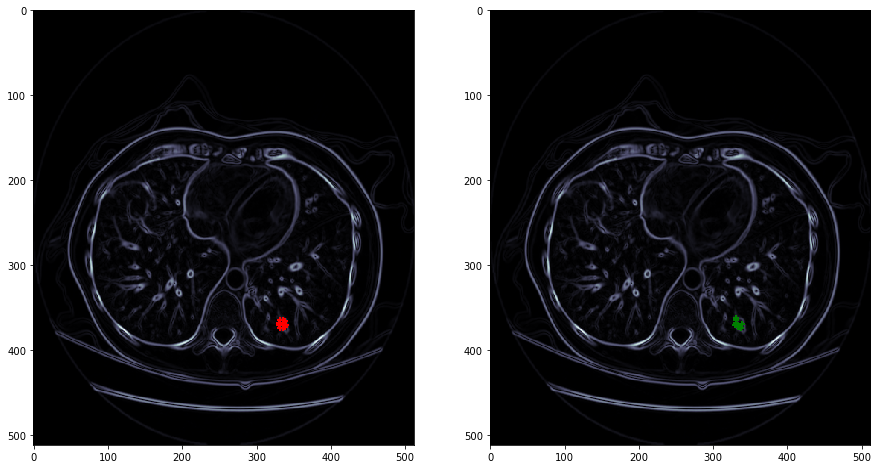

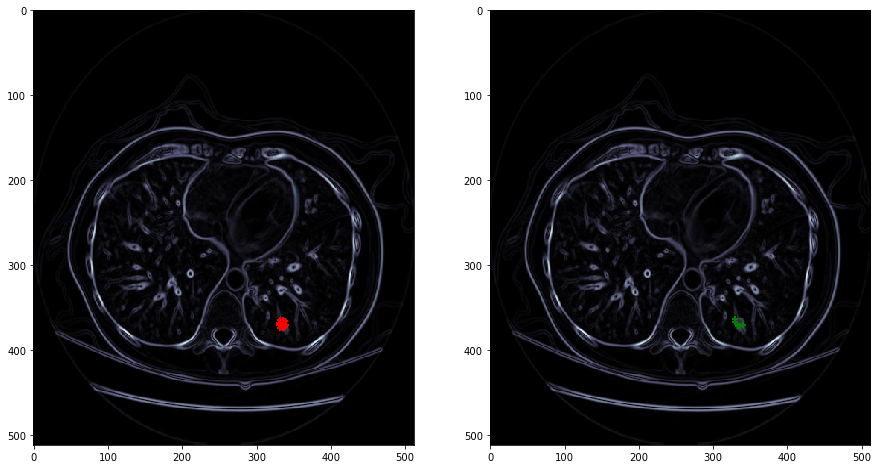

In [ ]:

image_3d, keys, dicom_headers = current_series.read_3d_image()
min_z_value = keys[0]    
points = current_series.get_segmentation_points(image_3d, min_z_value, dicom_headers.SliceThickness)
    
z_index = 47    
image_2d = image_3d[:,:,z_index]
fig, ax = plt.subplots(1,2,figsize=(12,6))
ax[0].imshow(image_3d[:,:,z_index], cmap=plt.cm.bone, aspect='auto')

ax[1].imshow(image_2d, cmap=plt.cm.bone, aspect='auto')

plt.show()

init_point = (335,370,z_index)
user_points = []
user_points.append(init_point)

r = 5
s = np.linspace(0, 2*np.pi, 10)
x = init_point[0] + r*np.cos(s)
y = init_point[1] + r*np.sin(s)
z = init_point[2] + r*np.sin(s)
for i in range(0,len(x)):
    user_points.append((int(x[i]),int(y[i]), z_index))
    
print user_points
    
    
image_3d_filtered = ndi.gaussian_filter(image_3d, sigma=1)

gradient_image,gradient_dx,gradient_dy,gradient_dz = get_gradient_image(image_3d_filtered)

fig, ax = plt.subplots(2,2,figsize=(15,12))
ax[0,0].imshow(image_3d[:,:,z_index], cmap=plt.cm.bone, aspect='auto')
ax[0,0].plot(user_points[0][0],user_points[0][1],'+', mew=2,color='red')
ax[0,0].plot(user_points[1][0],user_points[1][1],'+', mew=2,color='red')

ax[0,1].imshow(gradient_image[:,:,z_index], cmap=plt.cm.bone, aspect='auto')
ax[0,0].plot(user_points[0][0],user_points[0][1],'+', mew=2,color='red')
ax[0,0].plot(user_points[1][0],user_points[1][1],'+', mew=2,color='red')
ax[1,0].imshow(image_3d[:,:,z_index], cmap=plt.cm.bone, aspect='auto')
plt.show()
markers,iterations = get_watershed_marker_points(gradient_image, gradient_dx, gradient_dy, gradient_dz, user_points)
    
print "========== FINISHED! =========="            
print "Iterations: ",iterations
print "Markers: ",len(markers)

check_progress(markers,z_index-2,user_points)
check_progress(markers,z_index-1,user_points)
check_progress(markers,z_index,user_points)
check_progress(markers,z_index+1,user_points)
check_progress(markers,z_index+2,user_points)

watershed_marker,all_x,all_y,all_z = get_watershed_marker(markers,image_3d.shape)
border = 30
min_x = np.min(all_x) - border
max_x = np.max(all_x) + border
min_y = np.min(all_y) - border
max_y = np.max(all_y) + border
min_z = np.min(all_z) - border
max_z = np.max(all_z) + border

print "Cropping image"

fig, ax = plt.subplots(1,2,figsize=(15,6))
ax[0].imshow(image_3d[min_x:max_x,min_y:max_y,z_index], cmap=plt.cm.bone, aspect='auto')
ax[1].imshow(watershed_marker[min_x:max_x,min_y:max_y,z_index], cmap=plt.cm.bone, aspect='auto')
plt.show()

print "Generating watershed"
image_watershed = np.zeros(image_3d.shape)
image_watershed[min_x:max_x,min_y:max_y,min_z:max_z] = watershed(gradient_image[min_x:max_x,min_y:max_y,min_z:max_z], watershed_marker[min_x:max_x,min_y:max_y,min_z:max_z])

print image_watershed.shape

fig, ax = plt.subplots(1,2,figsize=(15,6))
ax[0].imshow(image_3d[:,:,z_index], cmap=plt.cm.bone, aspect='auto')
ax[0].plot(user_points[0][0],user_points[0][1],'+', mew=2,color='red')
ax[0].plot(user_points[1][0],user_points[1][1],'+', mew=2,color='red')

ax[1].imshow(image_watershed[:,:,z_index], cmap=plt.cm.bone, aspect='auto')
plt.show()

image_watershed_filtered = np.where(image_watershed >128, image_3d,float('nan'))
fig, ax = plt.subplots(1,2,figsize=(15,5))
ax[0].imshow(image_3d[:,:,z_index], cmap=plt.cm.bone, aspect='auto')
ax[1].imshow(image_watershed_filtered[:,:,z_index], cmap=plt.cm.bone, aspect='auto')
plt.show()


# Titulo

In [ ]:
# Set limits and number of points in grid
y, x = np.mgrid[10:-10:100j, 10:-10:100j]

x_obstacle, y_obstacle = 0.0, 0.0
alpha_obstacle, a_obstacle, b_obstacle = 1.0, 1e3, 2e3

p = -alpha_obstacle * np.exp(-((x - x_obstacle)**2 / a_obstacle
                               + (y - y_obstacle)**2 / b_obstacle))
# For the absolute values of "dx" and "dy" to mean anything, we'll need to
# specify the "cellsize" of our grid.  For purely visual purposes, though,
# we could get away with just "dy, dx = np.gradient(p)".
dy, dx = np.gradient(p, np.diff(y[:2, 0]), np.diff(x[0, :2]))

fig, ax = plt.subplots()
ax.quiver(x, y, dx, dy, p)
ax.set(aspect=1, title='Quiver Plot')
plt.show()

In [ ]:
# Cancer 3D

In [ ]:
  
    
for series_i in series_of_interest:    
    image_3d, keys, dicom_headers = series_i.read_3d_image()
    min_z_value = keys[0]    
    points = series_i.get_segmentation_points(image_3d, min_z_value, dicom_headers.SliceThickness)
    
    
    #for i,specialist_points in points.by_specialist.items():
    i,specialist_points = points.by_specialist.items()[0]
    segmentation_3d = np.zeros(image_3d.shape)

    for point in specialist_points:
        segmentation_3d[point.x,point.y,point.z] = 1

    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(111, projection='3d')

    z,x,y = segmentation_3d.nonzero()
    ax.scatter(x, y, -z, zdir='z')
    plt.show()

    struct1 = ndi.generate_binary_structure(3, 2)
    print struct1

    segmentation_3d_changed = segmentation_3d
    segmentation_3d_changed = ndi.binary_dilation(segmentation_3d_changed, structure=struct1)
    segmentation_3d_changed = ndi.binary_dilation(segmentation_3d_changed, structure=struct1)
    segmentation_3d_changed =ndi.binary_closing(segmentation_3d_changed, structure=struct1)
    segmentation_3d_changed =ndi.binary_erosion(segmentation_3d_changed, structure=struct1)
    segmentation_3d_changed =ndi.binary_erosion(segmentation_3d_changed, structure=struct1)

    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(111, projection='3d')

    z,x,y = segmentation_3d_changed.nonzero()
    ax.scatter(x, y, -z, zdir='z')
    plt.show()
    print "-------------"

